# Projet Fil <span style='color:red'> Rouge  </span> 2023 : Reconnaissance de commandes audio

**Last name :** Besbes & Rool

**First Name :** Inès & Sara

**Name of the pair :** Besbouilla

**Summary :**
- I) Preprocessing
- II) Multiclass regression
- III) Classification by kernel methods
- IV) Classification by ensemble methods
- V) Neural networks

# I) Preprocessing

## Import utils

We packaged all our functions and imports in utils.py.

In [201]:
import utils
from utils import *
import importlib

In [202]:
importlib.reload(utils)

<module 'utils' from '/home/besbesines/Documents/4ModIA/S2/MachineLearning/Projet_Fil_Rouge/utils.py'>

## Import & trim data

From moodle, we import a file of audio recordings of command words for a quadcopter drone made up of several male speakers (denoted M01..M13) and female speakers (F01..F05) for a few commands. We trim the recordings to isolate the word and have identical durations.

In [3]:
data = [] 
label = [] 
genres = []
min_duration = None
words = ['avance','recule','tournegauche']
list_genres = ['M', 'F']

for file_name in glob.glob('FichierTest/*.wav'):
    record = librosa.load(file_name)[0]
    data.append(record)
    # Computation of the minimal size of recordings
    if min_duration is None or record.shape[0] < min_duration:
        min_duration = record.shape[0] 
    
    # Creation of the vector of label
    for i, word in enumerate(words):
      if re.search(word, file_name):
        label.append(i)

    # Creation of the vector of label
    for i, genre in enumerate(list_genres):
      if re.search(genre, file_name[12:]):# 12 is for ignoring "FichierTest/"
        genres.append(genre)

fs = librosa.load(file_name)[1] # Sampling frequency
genres = np.array(genres)
print(f'The smallest record contains {min_duration} samples, and the sample frequency is {fs} Hz')


The smallest record contains 18522 samples, and the sample frequency is 22050 Hz


In [4]:
def trim(record):
    half_duration = 18522//2

    # First, we compute the barycenter of energy along time. We interpret it as the moment when the word appears
    barycenter = int(np.floor(np.multiply(np.power(record,2),np.arange(0,record.shape[0],1)).sum()/np.power(record,2).sum()))

    # Second, we adjust the barycenter to be in the index range
    if barycenter-half_duration < 0:
        barycenter += half_duration-barycenter
    if barycenter+half_duration >= record.shape[0]:
        barycenter -= barycenter+half_duration - record.shape[0]
    
    # Finally, we trim the recording around the barycenter 
    return record[barycenter-half_duration:barycenter+half_duration]

In [5]:
X = np.empty((len(data),min_duration))
for i in range(len(data)):
    X[i,:] = trim(data[i])

y = np.array(label)
print(f'Shape of inputs X is{X.shape} and size of targets class is {y.shape}')

Shape of inputs X is(54, 18522) and size of targets class is (54,)


## Dimension reduction

We use spectral representation to reduce the dimension of our data. Indeed, we have at the beginning 54 signals of 18522 data each. It is important to reduce the dimension before applying classifiers to <b>facilitate their performance and results</b>.

For this, we implement 2 methods: 

- FFT & PCA
- STFT


### FFT & PCA

The FFT helps transform signals to extract relevant frequency-based features. The PCA reduces the dimensionality of the extracted features, making processing and analysis more efficient while minimizing information loss.
This combination is particularly useful for signal processing and pattern recognition, allowing for more compact and manageable data without losing essential information.

In [6]:
X_fft = fft(X)
pca = PCA()
pca.fit(np.absolute(X_fft.T)) #we take the module of X_fft

PCA()

In [7]:
eig = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(54)], 
        "Variance expliquée" : pca.explained_variance_,
        "% variance expliquée" : np.round(pca.explained_variance_ratio_ * 100),
        "% cum. var. expliquée" : np.round(np.cumsum(pca.explained_variance_ratio_) * 100)
    }
).rename(columns = {'% cum. var. expliquée' : '% cumulative variance'})

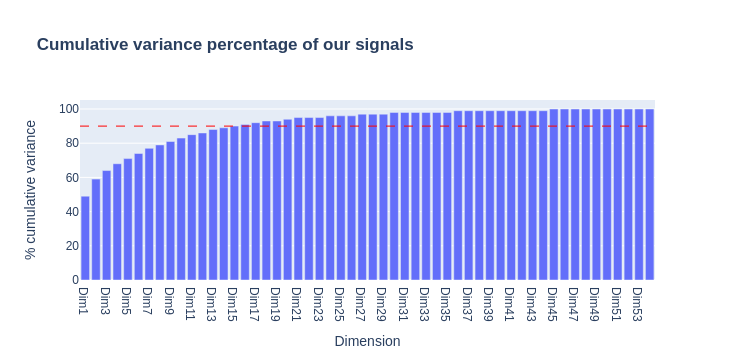

In [8]:
fig = px.bar(eig, x="Dimension", y="% cumulative variance", title='<b>Cumulative variance percentage of our signals</b>')
fig.add_hline(y=90, line_width=1, line_dash="dash", line_color="red")
fig.show()

<div class="alert alert-block alert-info">
With the graph au desus, we decide to keep 15 components.
</div>

### STFT

The Short-Time Fourier Transform (STFT) is a technique that allows for analyzing the frequency variations of a signal over time. It involves dividing the signal into short time segments and applying the Fourier Transform to each segment.

In [9]:
nperseg = 253
f, t, X_stft = signal.stft(record, fs=fs, window='hann', nperseg=nperseg, noverlap=None)
# X_stft.shape

(127, 147)


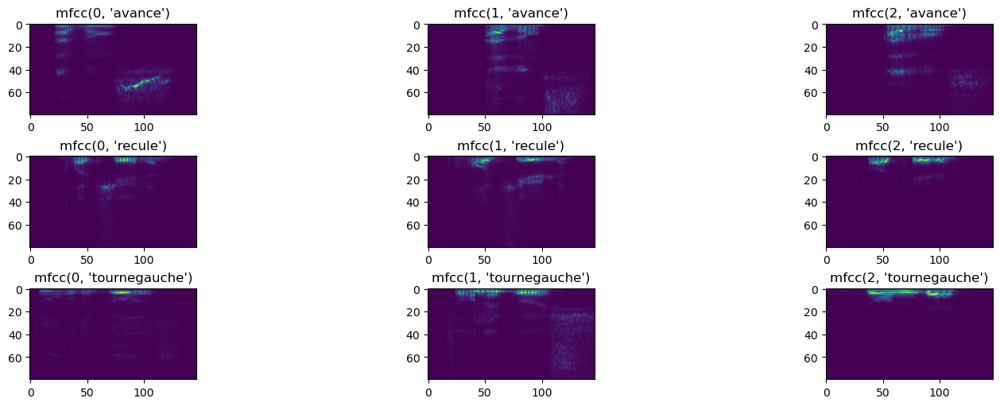

In [10]:
fig, axs = plt.subplots(3, 3, constrained_layout=True, figsize=(15,5))
for i,word in enumerate(words):
    for instance in range(3):

        record = X[(y==i) & (genres == 'M')][instance]
        f, t, Zxxm = signal.stft(record, fs=fs, window='hann', nperseg=nperseg, noverlap=None)
        axs[i,instance].imshow(np.absolute(Zxxm[:80])) # we cut the frequencies here
        axs[i,instance].set_title(f'mfcc{instance,word}')

        
print(Zxxm.shape)
plt.show()

(127, 147)


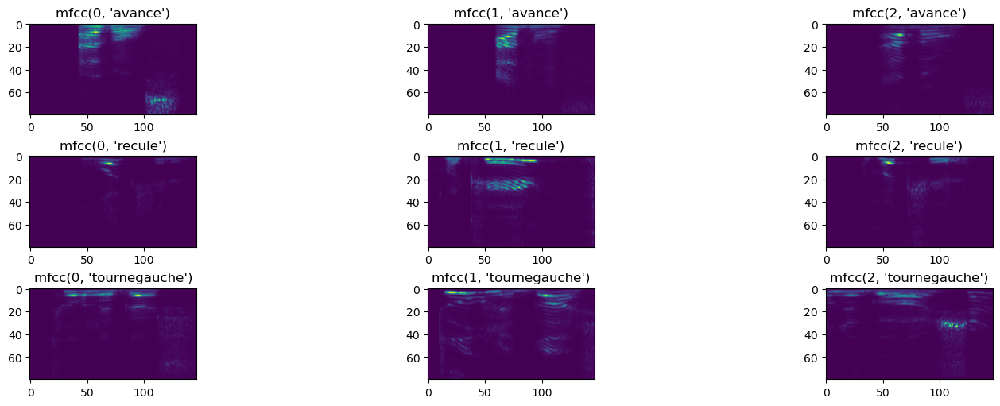

In [11]:
fig, axs = plt.subplots(3, 3, constrained_layout=True, figsize=(15,5))
for i,word in enumerate(words):
    for instance in range(3):

        record = X[(y==i) & (genres == 'F')][instance]
        f, t, Zxxf = signal.stft(record, fs=fs, window='hann', nperseg=nperseg, noverlap=None)
        axs[i,instance].imshow(np.absolute(Zxxf[:80])) # we cut the frequencies here
        axs[i,instance].set_title(f'mfcc{instance,word}')

        
print(Zxxf.shape)
plt.show()

<div class="alert alert-block alert-info">
The dimension of X after the STFT and without cutting frequencies is (127, 168).

We notice that we can cut the frequencies at 80 because there is no information beyond.
</div>

### Class construction


We define 2 classes: FFT and STFT. We need this to be able to use transform functions in our pipelines that are not defined in the python functions.

In [124]:
class FFT(BaseEstimator, TransformerMixin):
    def __init__(self, idx_frequence_max=None):
        self.idx_frequence_max = idx_frequence_max
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        return np.absolute(fft(X)[:self.idx_frequence_max])

In [125]:
class STFT():
    def __init__(self, idx_frequence_max = None, stat = None):
        self.idx_frequence_max = idx_frequence_max    
        self.stat = stat
        
    def fit(self, X, y=None):
        return self
        
    def transform(self, X, y=None):
        nperseg = 253
        f, t, Zxxm = signal.stft(X, fs=fs, window='hann', nperseg=nperseg, noverlap=None)
        Zxxm_trans = np.absolute(Zxxm[:, :self.idx_frequence_max, :])
        X_trans = np.zeros((Zxxm_trans.shape[0],Zxxm_trans.shape[1]))
        for s in range(Zxxm_trans.shape[0]):
            for i in range(Zxxm_trans.shape[1]):
                X_trans[s, i] = self.stat(Zxxm_trans[s,i,:])
        return X_trans

    #usefull to use pipeline
    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

# II) Multiclass regression

In this part, we consider a logistic regression model.


We model the probabilities by the following form :

$$
\mathbb{P}(Y_i = j) = \frac { \exp^{-\beta_j^{T} X_i } } {1 + \sum_{\ell = 1}^{K-1} \exp^{-\beta_\ell^{T} X_i }}, 
$$
For all $j$ in $\{ 1,2, \dots , K-1 \}$.


## Cross validation from scratch

To better understand cross validation, we implement the function ourselves. We will then use the already existing functions. We also decided to implement other functions to simplify the display in py.

This <b>CrossValidation</b> function takes as input the X, y and the coefficient C for the logistic regression. Then returns the mean_accuracy_train, mean_accuracy_test, y_test and y_pred_test.

In [14]:
def CrossValidation(X, y, C, n = 3):
    #shuffle indexs
    idx = np.arange(X.shape[0])
    idx = shuffle(idx)
    Xs = X[idx]
    ys = y[idx]

    #we divide into 3 sets
    n_folds = n
    l = Xs.shape[0]
    X_test = []
    X_train = []
    y_test = []
    y_train = []
    for i in range(n_folds):
        idx_test = idx[round(l*i/n_folds):round(l*(i+1)/n_folds)]
        idX_train = idx.tolist()
        for j in idx_test:
            idX_train.remove(j)
        X_test.append(Xs[idx_test, :])
        X_train.append(Xs[idX_train, :])
        y_test.append(ys[idx_test])
        y_train.append(ys[idX_train])

    #model instanciation
    model = LogisticRegression(C = C, max_iter = 1000)

    #computing the score
    score_test = []
    score_train = []
    for i in range(n_folds):
        model.fit(X_train[i], y_train[i])
        y_pred_train = model.predict(X_train[i])
        y_pred_test = model.predict(X_test[i])
        fold_score_test = accuracy_score(y_test[i], y_pred_test)
        score_test.append(fold_score_test)
        fold_score_train = accuracy_score(y_train[i], y_pred_train)
        score_train.append(fold_score_train)
    mean_accuracy_test = np.mean(score_test)
    mean_accuracy_train = np.mean(score_train)
    return mean_accuracy_test, mean_accuracy_train, y_test, y_pred_test

### Results on initial data

We apply the algorithm directly to the data without transformations. We then see overfitting which gives poor results on the prediction of the test data but very good results on the training data (hence the overfitting).

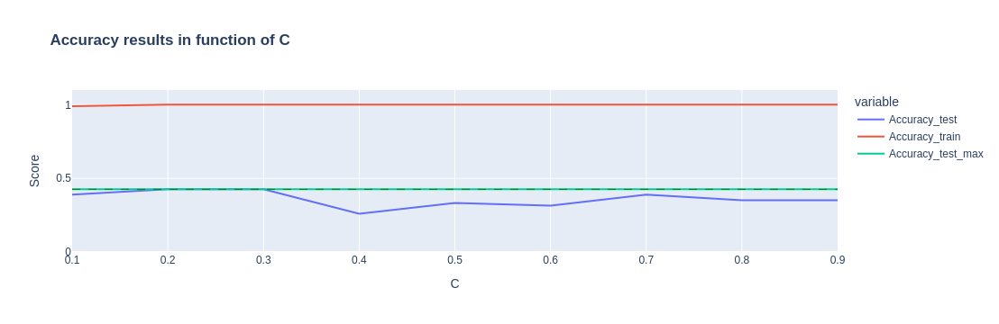

The best test score is : 0.4259259259259259


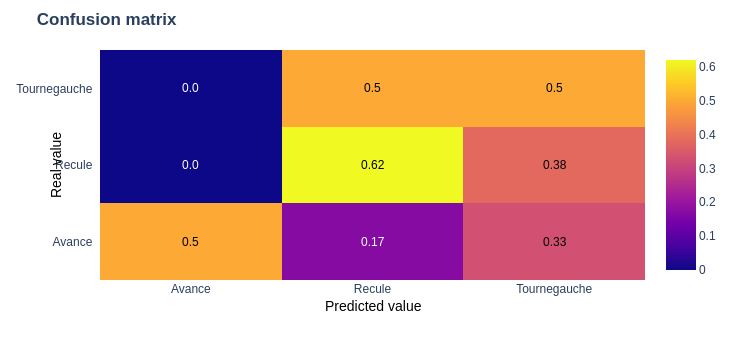

In [30]:
df_initial_data = df_C_variation(X, y, 0.1, 1, 0.1)
plot_accuracy(df_initial_data)
confusion_matrix_from_df(df_initial_data)

<div class="alert alert-block alert-info">
We notice thanks to the confusion matrix above that our data is very poorly classified. We must therefore necessarily modify our data.
</div>

### Results on FFT & PCA data

We apply the regression model to our data transformed by FFT & PCA. We kept <b>15 dimensions</b> from the PCA.

In [33]:
pca = PCA(n_components=15)
X_pca = pca.fit(np.absolute(X_fft.T)).components_.T

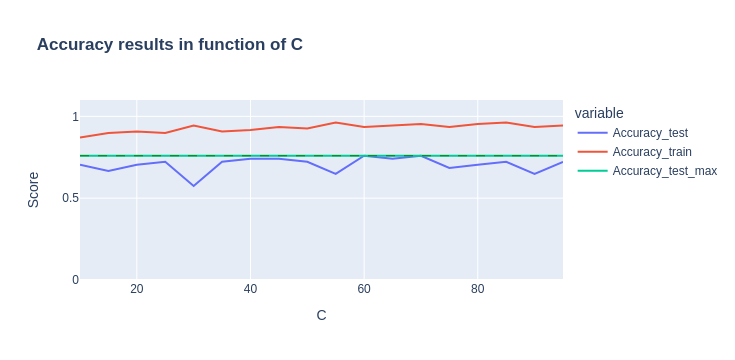

The best test score is : 0.7592592592592592


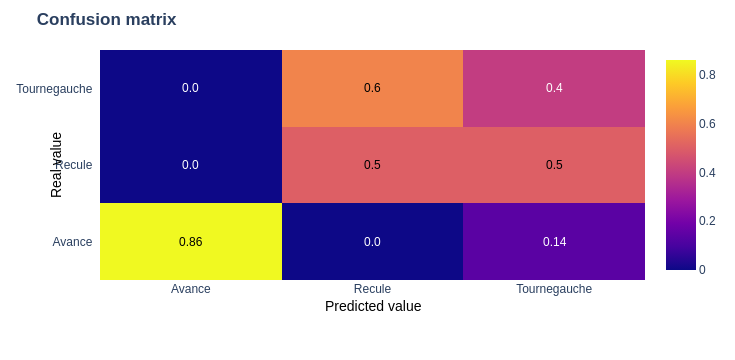

In [34]:
df_fft_pca_data = df_C_variation(X_pca, y, 10, 100, 5)
plot_accuracy(df_fft_pca_data)
confusion_matrix_from_df(df_fft_pca_data)

<div class="alert alert-block alert-info">
We see that our data is much better classified. In fact, we classified correctly 70% of the time. We also notice that we no longer have any overfitting.</div>

### Results on STFT data

We do the same thing as before but on our data modified by STFT. We fix the max frequency at 90 and we chose np.mean as statistics.

In [35]:
stft = STFT(idx_frequence_max = 90, stat = np.mean)
X_stft = stft.transform(X)

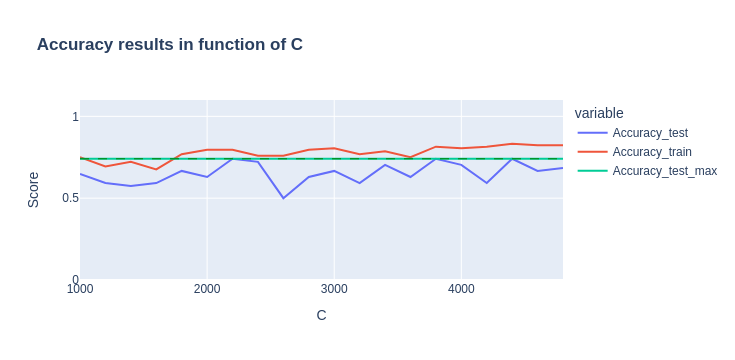

The best test score is : 0.7407407407407408


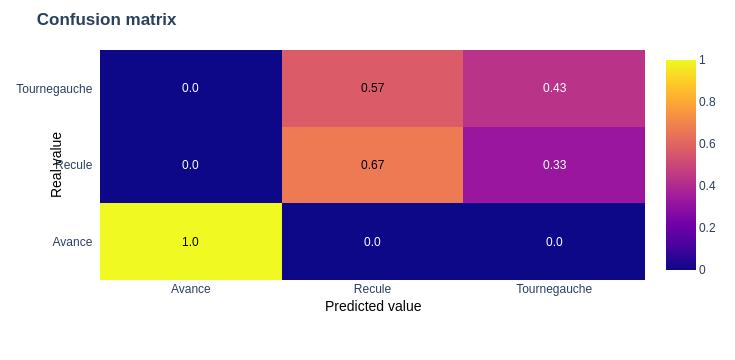

In [36]:
df_stft_data = df_C_variation(X_stft, y, 1000, 5000, 200)
plot_accuracy(df_stft_data)
confusion_matrix_from_df(df_stft_data)

<div class="alert alert-block alert-info">
Similar results are obtained when using FFT & PCA. These predictions are satisfactory. There's no overfitting. </div>

### Results on STFT & Scaling

This time, we scale our data after applying the stft.

In [37]:
scaler_stft = StandardScaler()
X_stft_scale = scaler_stft.fit_transform(stft.transform(X))

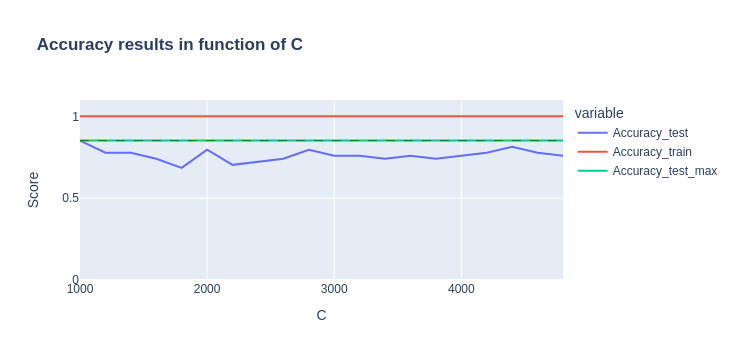

The best test score is : 0.8518518518518517


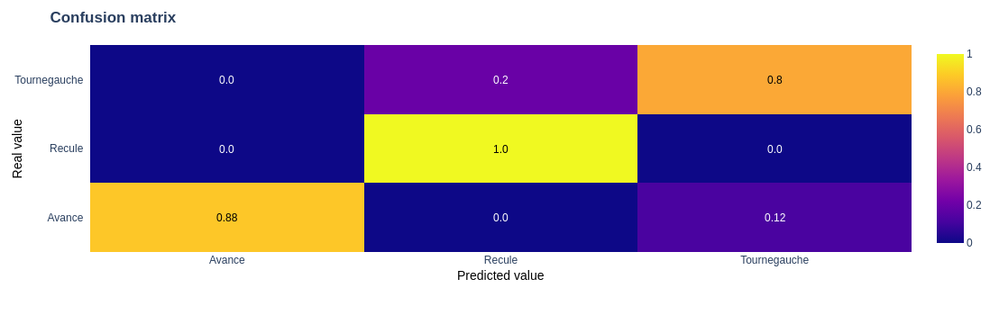

In [38]:
df_stft_scale_data = df_C_variation(X_stft_scale, y, 1000, 5000, 200)
plot_accuracy(df_stft_scale_data)
confusion_matrix_from_df(df_stft_scale_data)

<div class="alert alert-block alert-info">
By scaling our data, we obtain very good predictions. We obtain a maximum accuracy of 90%. And we see that our confusion matrix is ​​pretty accurate.</div>

<div class="alert alert-block alert-info">
Indeed, scaling data before performing logistic regression is important for several reasons:

- Improved Convergence
- Coefficients Interpretation
- Avoiding Numerical Issues
- Distance-Based Algorithms: Logistic regression can be influenced by the distances between points in the feature space.
</div>

## Cross validation using GridSearchCV

In a similar way, we find the previous results but using the functions already existing in Python. This will allow us to test different coefficients.

### Find the best logistic regression model & parameters

First, we need to create all the necessary commands. For that, we create a fonction that add a model to the following pipeline : 
    
- pipe_1 : FFT + PCA + model
- pipe_2 : FFT + scale + PCA + model
- pipe_3 : STFT + model
- pipe_4 : STFT + scale + model

We also need to create the param_grid/values associated with each pipeline.

In [14]:
param_grid_log_reg = [{
    "pca__n_components": [15, 20],
    "logistic__C": [1, 10, 100, 500],
},

{
    "pca__n_components": [15, 20],
    "logistic__C": [1,10, 50, 100, 150,],
},

{
    "logistic__C": [500, 600, 700, 800],
    "stft__stat": [np.mean, np.max, np.median, np.min, np.std],
    "stft__idx_frequence_max": [90, 95],
},

{
    "logistic__C": [0.5, 1, 1.5, 5],
    "stft__stat": [np.mean, np.max, np.median, np.min, np.std],
    "stft__idx_frequence_max": [95, 100],
}]

In [15]:
logistic = LogisticRegression(max_iter=10000, random_state = 42)

In [16]:
clfs_logistic_regression = set_pipelines(X, y, logistic, 'logistic', param_grid_log_reg)

### Results on FFT & PCA data

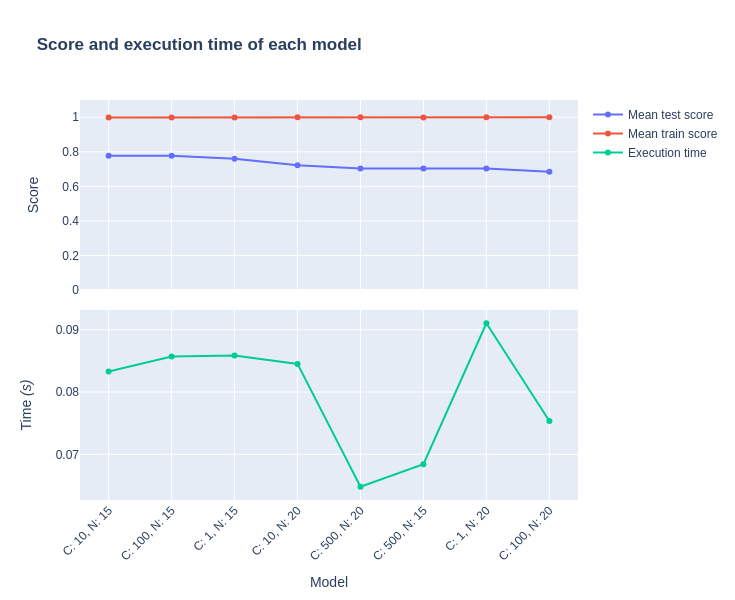

Best parameters: {'logistic__C': 10, 'pca__n_components': 15}
Best score: 0.7777777777777778


In [17]:
plot_score_time_clf(clf_transform(clfs_logistic_regression[0], "reg_1"))

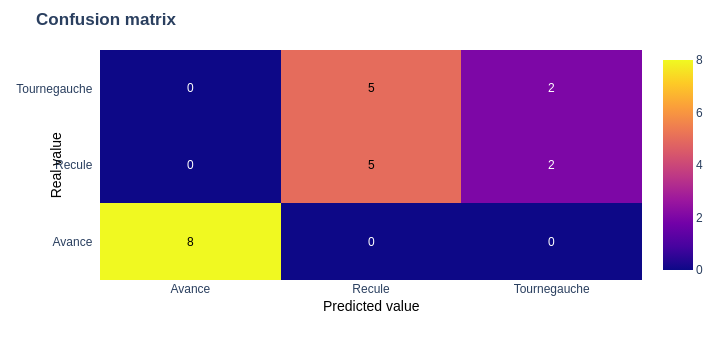

In [18]:
confusion_matrix_clf(clfs_logistic_regression[0], X, y)

### Results on FFT & Scale & PCA data

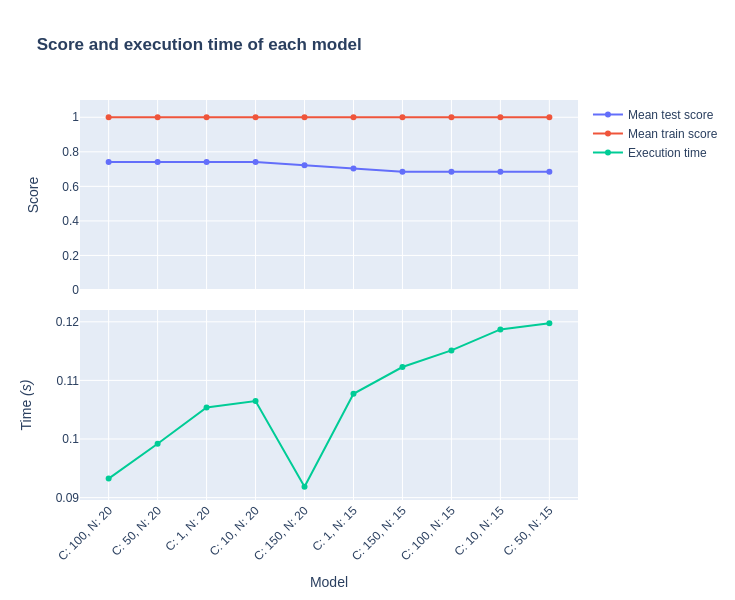

Best parameters: {'logistic__C': 1, 'pca__n_components': 20}
Best score: 0.7407407407407407


In [19]:
plot_score_time_clf(clf_transform(clfs_logistic_regression[1],"reg_1"))

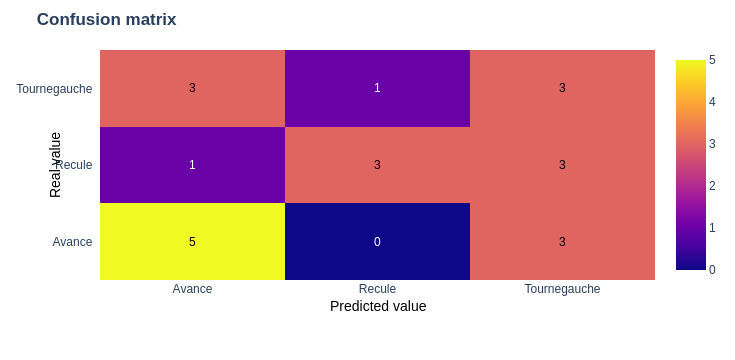

In [20]:
confusion_matrix_clf(clfs_logistic_regression[1], X, y)

### Results on STFT data

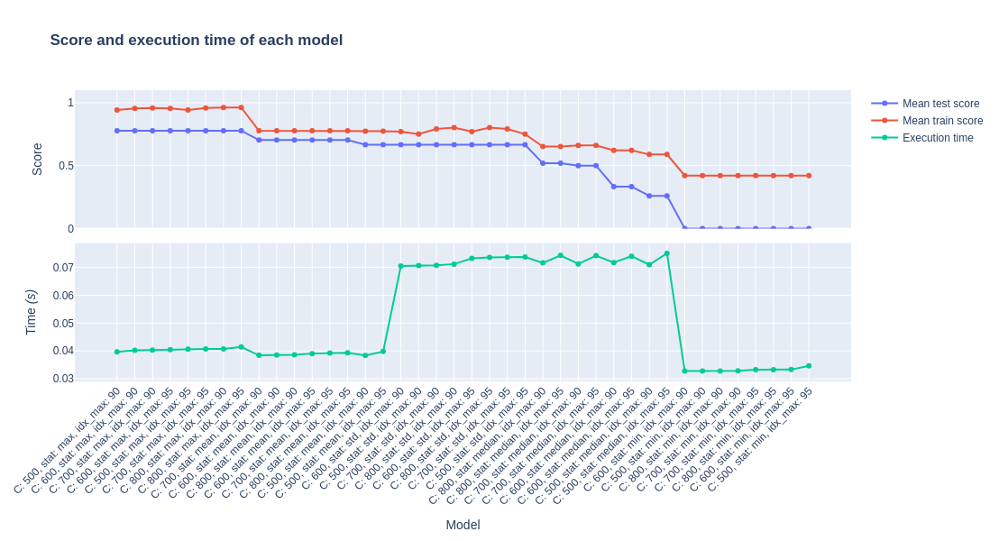

Best parameters: {'logistic__C': 500, 'stft__idx_frequence_max': 90, 'stft__stat': <function max at 0x771c917519f0>}
Best score: 0.7777777777777778


In [21]:
plot_score_time_clf(clf_transform(clfs_logistic_regression[2], "reg_2"))

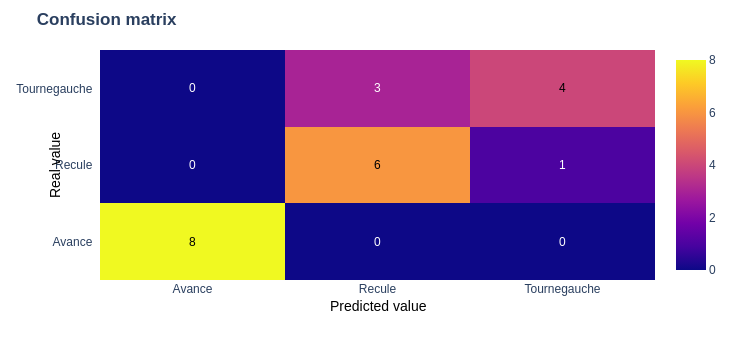

In [22]:
confusion_matrix_clf(clfs_logistic_regression[2], X, y)

### Results on STFT & Scale data

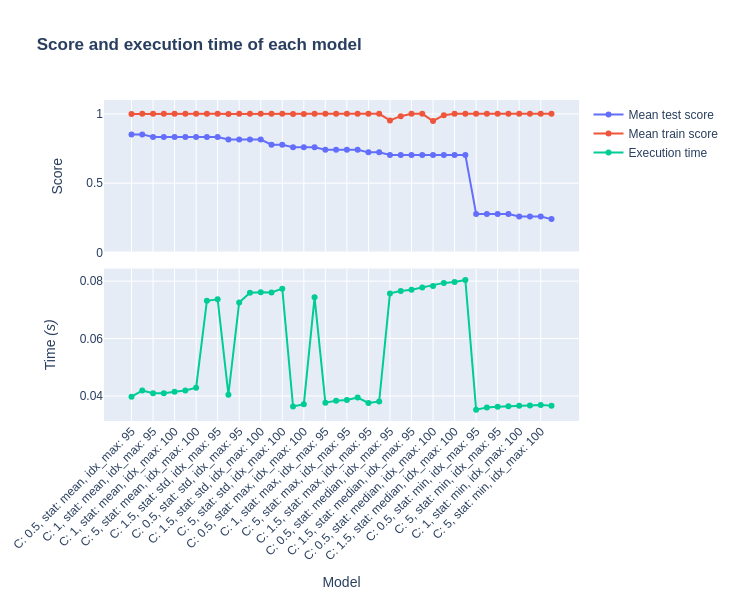

Best parameters: {'logistic__C': 0.5, 'stft__idx_frequence_max': 95, 'stft__stat': <function mean at 0x771c91752df0>}
Best score: 0.8518518518518519


In [23]:
plot_score_time_clf(clf_transform(clfs_logistic_regression[3], "reg_2"))

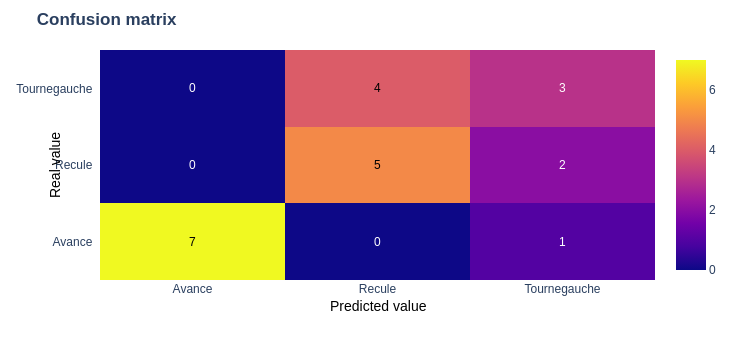

In [26]:
confusion_matrix_clf(clfs_logistic_regression[3], X, y)

### Summary

<div class="alert alert-block alert-info">
We see that the stft & scale transformation works better than the others. In this case, we arrive to identify "avance" but he has difficulty identifying "tourne gauche". </div>

In [36]:
dataframe_model_summary(clfs_logistic_regression)

,Pipeline,Score,logistic__C,pca__n_components,stft__idx_frequence_max,stft__stat
0,fft pca logistic,0.777778,10.0,15.0,NaN,NaN
1,fft scaler pca logistic,0.740741,1.0,20.0,NaN,NaN
2,stft logistic,0.777778,500.0,NaN,90.0,max
3,stft scaler logistic,0.851852,0.5,NaN,95.0,mean


# III) Classification by kernel methods


Support Vector Machine (SVM) works by finding the optimal hyperplane that separates data points of different classes with the maximum margin. For non-linearly separable data, SVM uses the kernel trick to transform data into a higher-dimensional space where a linear hyperplane can be established.

## Find the best SVM model & parameters

As before, we create the param grid for each kernel.

In [15]:
param_grid_svm_lin = [
{
    "pca__n_components": [15, 20],
    "SVM__kernel": ['linear'],
    "SVM__C": [0.1,0.5,1],
},

{
    "pca__n_components": [15, 17],
    "SVM__kernel": ['linear'],
    "SVM__C": [0.1,0.5,1],
},
    {
    "stft__stat": [np.max, np.mean, np.median],
    "stft__idx_frequence_max": [75, 80],
    "SVM__kernel": ['linear'],
    "SVM__C": [1000,2000,3000],
},
{
    "stft__stat": [np.max, np.mean, np.median],
    "stft__idx_frequence_max": [80, 90],
    "SVM__kernel": ['linear'],
    "SVM__C": [0.1,0.5,1,],
}]

In [16]:
param_grid_svm_gaus = [
{
    "pca__n_components": [15, 17],
    "SVM__kernel": ['rbf'],
    "SVM__C": [1,10,20,100],
    "SVM__gamma": ['scale', 'auto'] ,
},

{
    "pca__n_components": [15, 17],
    "SVM__kernel": ['rbf'],
    "SVM__C": [1,10,20,100],
    "SVM__gamma": ['scale', 'auto'] ,
},

{
    "stft__stat": [np.max, np.mean, np.median],
    "stft__idx_frequence_max": [80, 90],
    "SVM__kernel": ['rbf'],
    "SVM__C": [1,10,100,1000],
    "SVM__gamma": ['scale', 'auto'] ,
},

{
    "stft__stat": [np.max, np.mean, np.median],
    "stft__idx_frequence_max": [80, 90],
    "SVM__kernel": ['rbf'],
    "SVM__C": [0.1,1,10,100],
    "SVM__gamma": ['scale', 'auto'] ,
}]

In [17]:
param_grid_svm_poly = [
{
    "pca__n_components": [15, 17],
    "SVM__kernel": ['poly'],
    "SVM__C": [1,10,50,100],
    "SVM__gamma": ['scale', 'auto'],
    "SVM__degree": [3],

},

{
    "pca__n_components": [15, 17],
    "SVM__kernel": ['poly'],
    "SVM__C": [1,10,100,1000],
    "SVM__gamma": ['scale', 'auto'] ,
    "SVM__degree": [3],
},

{
    "stft__stat": [np.max, np.mean, np.median, np.min, np.std],
    "stft__idx_frequence_max": [80, 90],
    "SVM__kernel": ['poly'],
    "SVM__C": [50,100,1000],
    "SVM__gamma": ['scale', 'auto'] ,
    "SVM__degree": [3],
},

{
    "stft__stat": [np.max, np.mean, np.median, np.min, np.std],
    "stft__idx_frequence_max": [80, 90],
    "SVM__kernel": ['poly'],
    "SVM__C": [1,10,50,100],
    "SVM__gamma": ['scale', 'auto'],
    "SVM__degree": [3],
}
]

In [18]:
SVM = SVC(random_state = 42)

In [19]:
clfs_svm_lin = set_pipelines(X, y, SVM, 'SVM', param_grid_svm_lin)

In [20]:
clfs_svm_gaus = set_pipelines(X, y, SVM, 'SVM', param_grid_svm_gaus)

In [21]:
clfs_svm_poly = set_pipelines(X, y, SVM, 'SVM', param_grid_svm_poly)

## Summary

In [25]:
dataframe_model_summary(clfs_svm_gaus + clfs_svm_poly + clfs_svm_lin).sort_values(by=['Score'], ascending = False)

,Pipeline,Score,SVM__C,SVM__gamma,SVM__kernel,pca__n_components,stft__idx_frequence_max,stft__stat,SVM__degree
11,stft scaler SVM,0.851852,0.1,NaN,linear,NaN,90.0,mean,NaN
10,stft SVM,0.833333,2000.0,NaN,linear,NaN,75.0,max,NaN
2,stft SVM,0.814815,10.0,scale,rbf,NaN,80.0,mean,NaN
3,stft scaler SVM,0.814815,100.0,scale,rbf,NaN,90.0,mean,NaN
6,stft SVM,0.814815,1000.0,scale,poly,NaN,80.0,mean,3.0
9,fft scaler pca SVM,0.796296,0.1,NaN,linear,15.0,NaN,NaN,NaN
7,stft scaler SVM,0.777778,50.0,scale,poly,NaN,90.0,mean,3.0
8,fft pca SVM,0.777778,0.1,NaN,linear,15.0,NaN,NaN,NaN
0,fft pca SVM,0.740741,100.0,scale,rbf,15.0,NaN,NaN,NaN
1,fft scaler pca SVM,0.740741,100.0,scale,rbf,17.0,NaN,NaN,NaN


<div class="alert alert-block alert-info">
We see that the stft + scale transformation with the linear kernel works better than the others. We obtain a score of 85%. There seems to be an overfitting but very slight. With these data, the linear and rbf kernels seem to be more suitable. In general, we obtain better results with a STFT transformation. </div>

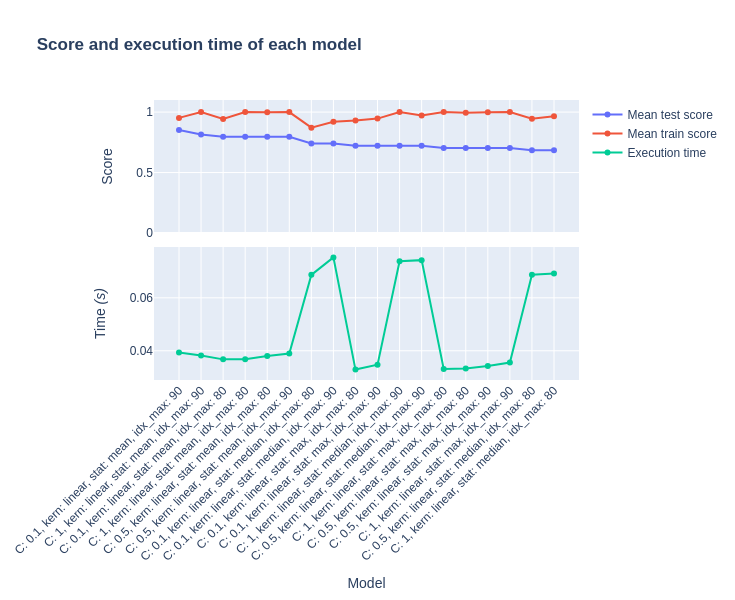

Best parameters: {'SVM__C': 0.1, 'SVM__kernel': 'linear', 'stft__idx_frequence_max': 90, 'stft__stat': <function mean at 0x709db4197770>}
Best score: 0.8518518518518519


In [27]:
plot_score_time_clf(clf_transform(clfs_svm_lin[3], "svm_l4"))

## Borderies visual representation

To display the decision borders, we apply a PCA with 2 dimensions before applying our SVM. It is a large approximation but the objective is just to visualize the effect of the different kernel. So the score will not be high but we don't focus on that.

In [28]:
clf_visu_lin, clf_visu_gaus, clf_visu_poly = clf_visu(X,y)

Best parameters: {'SVM__C': 1, 'SVM__kernel': 'linear'}
Best score: 0.37037037037037035


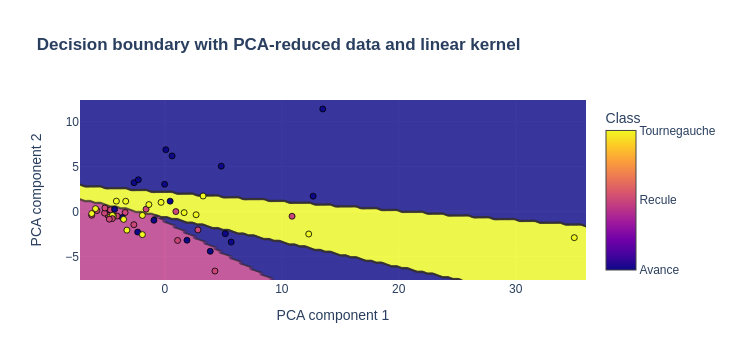

In [30]:
visu_border_svm(clf_visu_lin, X, y)

Best parameters: {'SVM__C': 20, 'SVM__gamma': 'scale', 'SVM__kernel': 'rbf'}
Best score: 0.3333333333333333


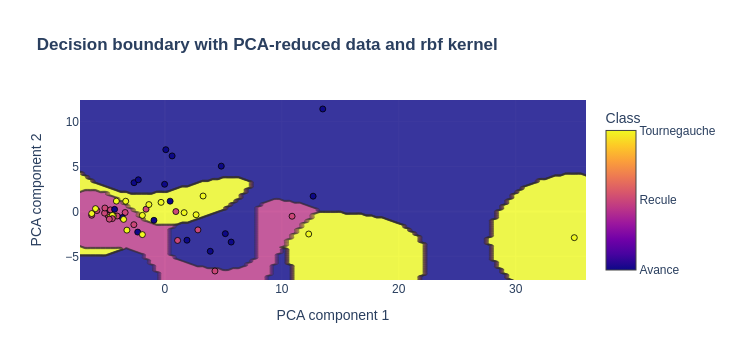

In [31]:
visu_border_svm(clf_visu_gaus, X, y)

Best parameters: {'SVM__C': 0.1, 'SVM__gamma': 'auto', 'SVM__kernel': 'poly'}
Best score: 0.16666666666666666


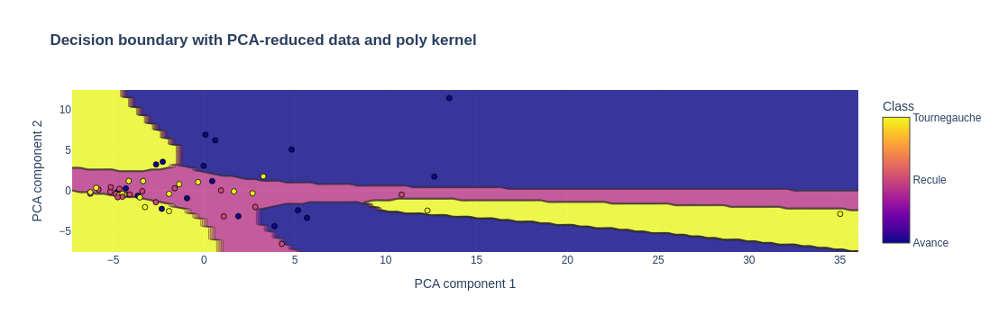

In [32]:
visu_border_svm(clf_visu_poly, X, y)

<div class="alert alert-block alert-info"> 
    
- With the linear kernel, we notice that we have linear decision zones. This creates plans.
- For the Gaussian kernel, the decision zones are kinds of spots. The bigger the C, the more there will be spots.
- And for the polynomial kernel, we obtain polynomial decision zones which can therefore be linear. As we see with the pink part which resembles the linear kernel.

</div>

# IV) Ensemble Method

## Bootstrap Aggregation : Bagging

Boostrap consists in creating multiple data sets as follows. Suppose our
original data set consists of $N$ data points $X = \{x_1,..., x_N \}$. We can create a new
data set $X_B$ by drawing $N$ points at random from X, with replacement, so that some
points in $X$ may be replicated in $X_B$, whereas other points in $X$ may be absent from
$X_B$. This process can be repeated $L$ times to generate $L$ data sets each of size $N$ and
each obtained by sampling from the original data set $X$.

Consider a binary classification problem in which we are trying to predict the class, and suppose we generate $M$ bootstrap data sets and then use each to train a separate copy $y_m(x)$ of a classifier where $m = 1,...,M$. The committee prediction is given by voting with all $M$ models.

### Bagging from scratch 

In [33]:
class Bagging:
    def __init__(self, BaseClassifierClass, num_clfs, max_depth=2):
        self.BaseClassifierClass = BaseClassifierClass
        self.num_clfs = num_clfs
        self.clfs = [self.BaseClassifierClass(max_depth = max_depth, random_state=42) for _ in range(self.num_clfs)]

    def fit(self, X, y):
        N = len(X)
        for m in range(self.num_clfs):
            sample_ind = np.random.choice(N, N, replace=True)
            X_resampled = X[sample_ind] 
            y_resampled = y[sample_ind]
            self.clfs[m].fit(X_resampled, y_resampled)

            
    def predict(self, X):
        base_pred = np.zeros((self.num_clfs, len(X)))
        for m in range(self.num_clfs):
            base_pred[m] = self.clfs[m].predict(X)
        return np.apply_along_axis(lambda x: np.bincount(x.astype(int)).argmax(), axis=0, arr=base_pred) #vote à la majorité


    def mean_acc(self, X, y):
        base_pred = np.zeros((self.num_clfs, len(X)))
        mean = []
        for m in range(self.num_clfs):
            base_pred[m] = self.clfs[m].predict(X)
            mean.append(accuracy_score(y,base_pred[m]))
        return mean

    def score(self,X,y):
        return accuracy_score(y, self.predict(X))

#### Binary classification problem

To apply binary classification, we need to transform our labels. Currently, our labels are 0,1 and 2 and we will transform them in 0 and 1.

In [34]:
y_binary = []
for i in range(len(y)):
    if y[i] == 1:
        y_binary.append(1)
    else:
        y_binary.append(0)
y_binary = np.array(y_binary)

#### Optimizing Model Performance with Bagging: A Decision Tree Approach

First, we implement bagging with an ensemble of 100 decision trees, varying the maximum depth of the trees between 1 and 2. To achieve this, we employ GridSearchCV on our initial dataset, which is manageable in size. This grid search will help us determine the optimal parameters for preprocessing our data. With these parameters identified, we can then apply the bagging method effectively, ensuring that we utilize the best possible configuration to enhance model performance.

In [35]:
params_bagging_fs = [ {
    "pca__n_components": [15,20],
},
{
    "pca__n_components": [15,20],
}, {
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [80,90], 
},
{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [80,90],
}]

In [36]:
M = 100
bagging_fs_1 = Bagging(DecisionTreeClassifier,M,1)
clfs_bagging_fs_1 = set_pipelines(X, y_binary, bagging_fs_1, "bagging",params_bagging_fs)
bagging_fs_2 = Bagging(DecisionTreeClassifier,M)
clfs_bagging_fs_2 = set_pipelines(X, y_binary, bagging_fs_2, "bagging",params_bagging_fs)

In [41]:
%store clfs_bagging_fs_1
%store clfs_bagging_fs_2

Stored 'clfs_bagging_fs_1' (tuple)
Stored 'clfs_bagging_fs_2' (tuple)


In [42]:
%store -r clfs_bagging_fs_1
%store -r clfs_bagging_fs_2

#### Results 

Here, we display the best mean test accuracy for each pipeline associated to the best classifier. We observe that the highest score is achieved with the second pipeline. This indicates that our input data (X) should be preprocessed using the following sequence: FFT, scaling, PCA, followed by bagging.

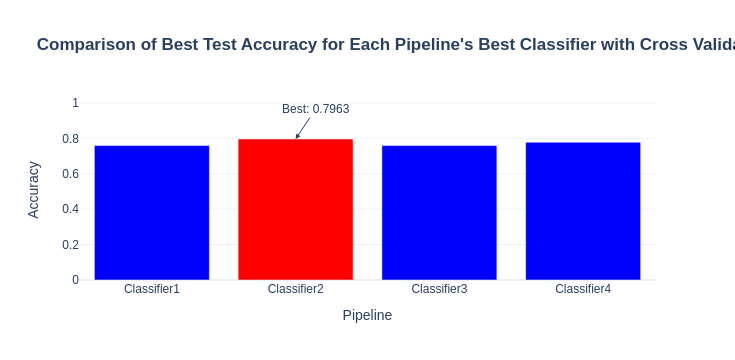

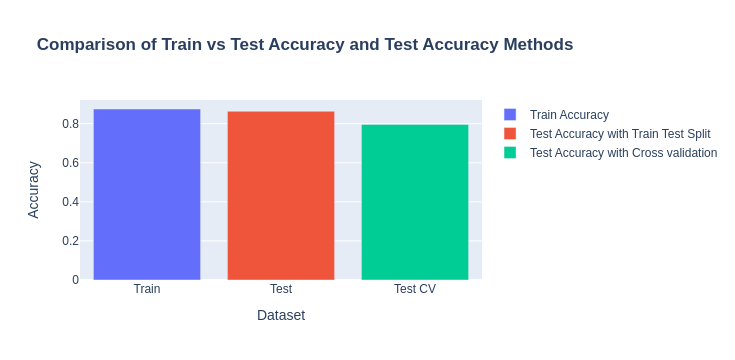

In [43]:
best_bagging_fs_clf_1, best_score_bagging_fs_1, best_params_bagging_fs_1 = get_best_classifier(clfs_bagging_fs_1)
X_train_bagging_fs, X_test_bagging_fs, y_train_bagging_fs, y_test_bagging_fs, train_score_bagging_fs_1, test_score_bagging_fs_1 = train_test_best_model(X,y_binary, best_bagging_fs_clf_1, best_params_bagging_fs_1)

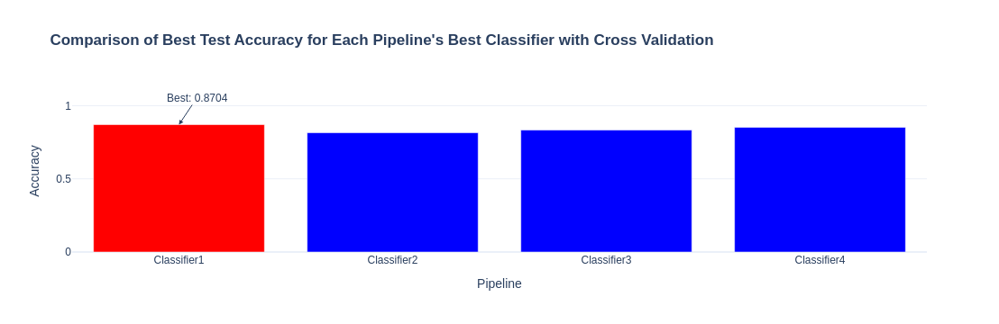

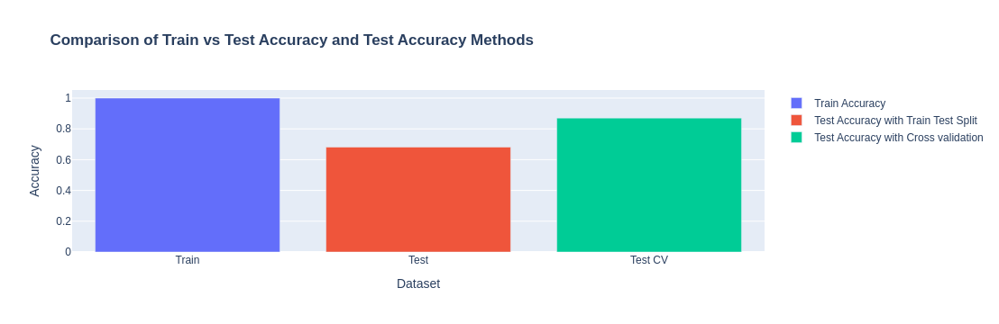

In [44]:
best_bagging_fs_clf_2, best_score_bagging_fs_2, best_params_bagging_fs_2 = get_best_classifier(clfs_bagging_fs_2)
X_train_bagging_fs, X_test_bagging_fs, y_train_bagging_fs, y_test_bagging_fs, train_score_bagging_fs_2, test_score_bagging_fs_2 = train_test_best_model(X,y_binary, best_bagging_fs_clf_2, best_params_bagging_fs_2)

<div class="alert alert-block alert-info">
We observe that with a maximum depth of 1, we obtain very good scores, and our model does not appear to overfit. Furthermore, the scores are close to those obtained from cross-validation. <br><br>

We repeated the process with a maximum depth of 2. The cross-validation results varied between 0.80 and 0.87, which is very good. However, we observed overfitting when fitting our model to the training data, which is limited in quantity. This resulted in a perfect train accuracy of 1 but an unsatisfactory test accuracy of 0.68.

This outcome is expected because there is more variance in the training split compared to leave-one-out cross-validation, leading to poorer results. 

However, we know that the deeper the tree is, the more complex the model becomes. In fact, while a deeper tree can fit the training data better, it also increases the risk of overfitting, which is what we observed.

Therefore, we chose the model with the best test accuracy, and without overfitting, which is the one with a maximum depth of 1.
</div>

#### Optimal Model Using Bagging with 100 Decision Trees and Max Depth of 1

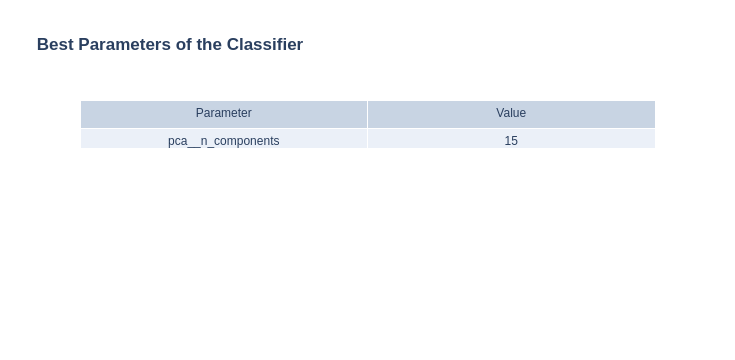

In [45]:
display_best_params_table(best_bagging_fs_clf_1.best_params_)

#### Comparing the accuracy of the best model with Bagging with the mean accuracy of the models

We will now calculate the average score of the 100 decision trees and compare it with the final score of the bagging model.

In [46]:
x_preprocessed = best_bagging_fs_clf_1.best_estimator_.named_steps["pca"].fit_transform(X)

In [47]:
x_train, x_test, y_train, y_test = train_test_split(x_preprocessed, y_binary, random_state=42)
best_bagging_fs_clf_1.best_estimator_.named_steps["bagging"].fit(x_train, y_train)

In [48]:
acc_models = best_bagging_fs_clf_1.best_estimator_.named_steps["bagging"].mean_acc(x_test, y_test)
np.mean(acc_models)

0.5671428571428572

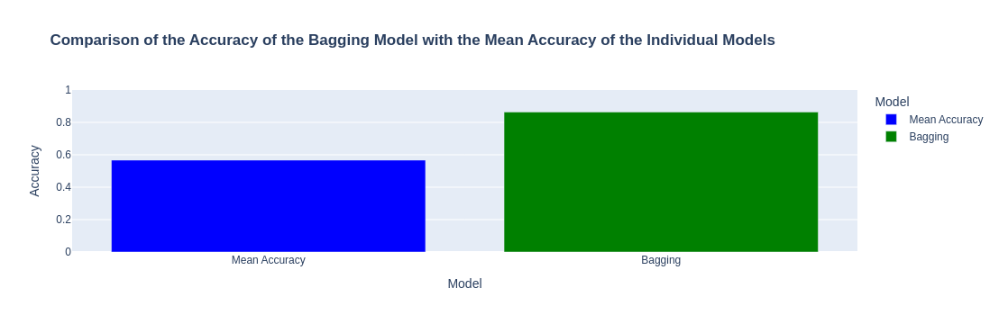

Bagging improves the accuracy compared to individual Decision Trees.


In [49]:
mean_acc_models = np.mean(acc_models)

results = pd.DataFrame({
    'Model': ['Mean Accuracy', 'Bagging'],
    'Accuracy': [mean_acc_models, test_score_bagging_fs_1]
})

# Plotting the results using Plotly
fig = px.bar(results, x='Model', y='Accuracy', color='Model',
             title='<b>Comparison of the Accuracy of the Bagging Model with the Mean Accuracy of the Individual Models</b>',
             labels={'Accuracy': 'Accuracy', 'Model': 'Model'},
             color_discrete_map={'Mean Accuracy': 'blue', 'Bagging': 'green'})
fig.update_yaxes(range=[0, 1])
fig.show()

if test_score_bagging_fs_2 > mean_acc_models:
    print("Bagging improves the accuracy compared to individual Decision Trees.")
else:
    print("Bagging does not improve the accuracy compared to individual Decision Trees.")

<div class="alert alert-block alert-info">
One of the strengths of bagging is its ability to reduce variance. Even though the models are not trained on the same dataset, the bootstrap samples share common tuples, which introduces bias. However, this bias helps to decrease variance. <br><br>

Another advantage is error correction. Each model makes classification prediction errors, but the voting system corrects each error. Plus, by aggregating predictions from multiple models, bagging tends to generate more robust predictions that generalize better across different scenarios compared to a single model. This explains the improvement in accuracy observed with the final bagging model compared to the mean accuracy of individual models.
</div>

### Find the best Random Forest model

We will now transition to a classification problem with three classes. Random Forest is closely related to bagging, but it's not exactly the same thing. Both Random Forest and bagging involve building multiple decision trees and aggregating their predictions. However, in Random Forest, further randomness is introduced by randomly selecting a subset of features for each tree as well. In contrast, with bagging, all features are considered for each tree.

Our goal is to find the best model with the highest test accuracy. To achieve this, we apply grid search on our initial dataset, defining a parameter grid for consideration. The key question is whether it's truly necessary to strive for the best parameters and a more complex model, or if doing so might lead to overfitting instead.

In [111]:
params_random_forest = [{
    "pca__n_components": [15,20],
    "RF__max_depth": [1,2,3], 
    "RF__n_estimators": [10,100], 
    "RF__min_samples_leaf": [1,3,5],
    "RF__min_samples_split": [2,4,6]
},{
    "pca__n_components":  [15,20],
    "RF__max_depth": [1,2,3], 
    "RF__n_estimators": [10,100], 
    "RF__min_samples_leaf": [1,3,5],
    "RF__min_samples_split": [2,4,6]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80],
    "RF__max_depth": [1,2,3], 
    "RF__n_estimators": [10,100], 
    "RF__min_samples_leaf": [1,3,5],
    "RF__min_samples_split": [2,4,6]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80], 
    "RF__max_depth": [1,2,3], 
    "RF__n_estimators": [10,100], 
    "RF__min_samples_leaf": [1,3,5],
    "RF__min_samples_split": [2,4,6]
}]

In [31]:
randomForest = RandomForestClassifier(random_state=42)
clfs_random_forest = set_pipelines(X, y, randomForest, "RF",params_random_forest)

In [32]:
%store clfs_random_forest

Stored 'clfs_random_forest' (tuple)


In [112]:
%store -r clfs_random_forest

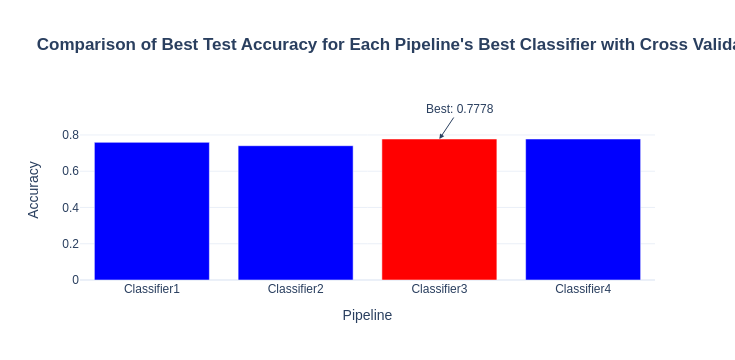

In [114]:
best_random_forest_clf, best_score_random_forest, best_params_random_forest = get_best_classifier(clfs_random_forest)
# choisir meilleur affichage pour le mean test score en fonction de la pipeline et des paramètres

#### Optimal Random Forest model

We notice that the best classifier is obtained with pipelines 3 and 4. We can choose either one. It would be interesting to select the one that takes less time.

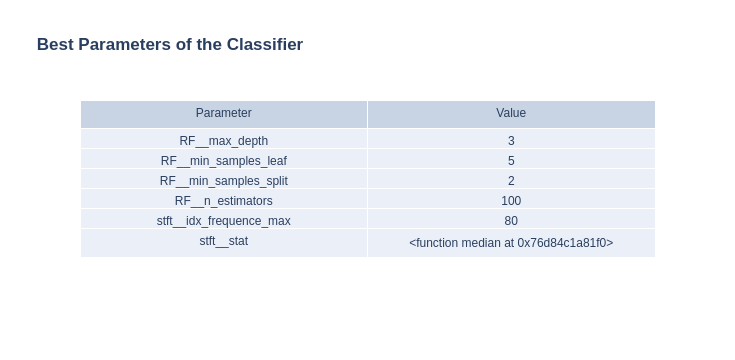

In [116]:
display_best_params_table(best_random_forest_clf.best_params_)

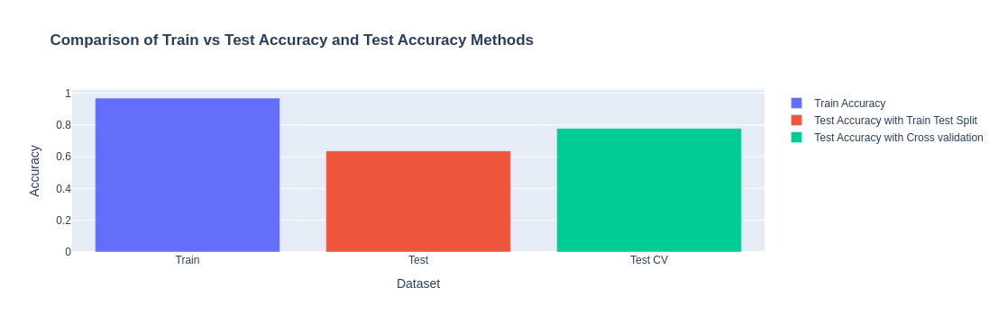

In [117]:
X_train_random_forest, X_test_random_forest, y_train_random_forest, y_test_random_forest, train_score_random_forest, test_score_random_forest = train_test_best_model(X,y, best_random_forest_clf, best_params_random_forest)

<div class="alert alert-block alert-info">
We notice that the test accuracy is lower than that of the cross-validation due to the smaller amount of data available for testing. We have a test accuracy of 0.63, suggesting that two classes are well learned while one class may have been confused with another.
</div>

## Adaptative boosting : AdaBoost

Here is the algorithm Adaboost

1. Initialize the data weighting coefficients $w_n$ by setting $w_n^{(1)} = \frac{1}{N}$ for $n = 1,...,N$.
2. For $m = 1,...,M$:
    
    **(a)** Fit a classifier $y_m(x)$ to the training data by minimizing the weighted error function
    
    $J_m = \sum_{n=1}^N{w_n^{(m)}I(y_m(x)\neq t_n)}$
    
    where $I(y_m(x)\neq t_n)$ is the indicator function and equals $1$ when $y_m(x_n) = t_n$ and $0$ otherwise.

    **(b)** Evaluate the quantities

    $\epsilon_m = \frac{\sum_{n=1}^N{w_n^{(m)}I(y_m(x)\neq t_n)}}{\sum_{n=1}^N{w_n^{(m)}}}$

    and then use these to evaluate

    $\alpha_m = \ln\left({\frac{1-\epsilon_m}{\epsilon_m}}\right)$

    **(c)** Update the data weighting coefficients
    
    $w_n^{(m+1)} = w_n^{(m)} \exp\left({\alpha_m I(y_m(x_n) \neq t_n)}\right)$

3. Make predictions using the final model, which is given by

    $Y_M(x) = \text{sign}\left(\sum_{m=1}^M {\alpha_m y_m(x)}\right)$


### Adaboost from scratch 

In [118]:
class AdaBoost:
    def __init__(self, BaseClassifierClass, num_clfs, max_depth=2):
        self.BaseClassifierClass = BaseClassifierClass
        self.num_clfs = num_clfs
        self.alpha = np.zeros(self.num_clfs) 
        self.clfs = [self.BaseClassifierClass(max_depth=max_depth, random_state=42) for _ in range(self.num_clfs)]
        
    def fit(self, X, y):
        N = len(X)
        w = np.ones(N)/N # initialize the weight
        for m in range(self.num_clfs):
            self.clfs[m].fit(X, y, sample_weight=w)
            predictions = self.clfs[m].predict(X)
            mistakes = predictions != y
            
            ep = np.sum(w * mistakes)
            if ep <= 0 or ep >= 1:
                self.alpha[m] = 0
            else:
                self.alpha[m] = np.log((1 - ep) / ep)

            # update the weight
            w *= np.exp(self.alpha[m] * mistakes)
            w /= np.sum(w)
        

    def predict(self, X):
        base_pred = np.zeros((len(X), self.num_clfs))
        for m in range(self.num_clfs):
            base_pred[:, m] = self.clfs[m].predict(X)

        class_votes = np.zeros((len(X), np.unique(base_pred).shape[0]))

        for m in range(self.num_clfs):
            for i in range(len(X)):
                class_votes[i, int(base_pred[i, m])] += self.alpha[m]

        final_predictions = np.argmax(class_votes, axis=1)
        return final_predictions
    
    def score(self, X, y):
        return accuracy_score(y, self.predict(X))


#### Optimizing Model Performance with AdaBoost: A Decision Tree Approach

We follow a similar approach with Bagging. First, we implement AdaBoost using an ensemble of 100 decision trees, varying the maximum depth of the trees between 1 and 2. To achieve this, we use GridSearchCV on our manageable initial dataset. Once we identify the best parameters, we can effectively apply the AdaBoost method, ensuring we use the optimal configuration to enhance model performance.

In [204]:
params_adaboost_fs = [{
    "pca__n_components": [15,20],
},{
    "pca__n_components": [15,20],
}, {
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80], 
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80], 
}]

In [45]:
adaboost_fs_1 = AdaBoost(DecisionTreeClassifier,M,1)
clfs_adaboost_fs_1 = set_pipelines(X, y_binary, adaboost_fs_1, "adaboost",params_adaboost_fs)
adaboost_fs_2 = AdaBoost(DecisionTreeClassifier,M,2)
clfs_adaboost_fs_2 = set_pipelines(X, y_binary, adaboost_fs_2, "adaboost",params_adaboost_fs)

In [ ]:
%store clfs_adaboost_fs_1
%store clfs_adaboost_fs_2

In [206]:
%store -r clfs_adaboost_fs_1
%store -r clfs_adaboost_fs_2

no stored variable or alias clfs_adaboost_fs_1
no stored variable or alias clfs_adaboost_fs_2


#### Results 

Here, we display the best mean test accuracy for each pipeline associated to the best classifier. We observe that the highest score is achieved with the second pipeline. This indicates that our input data (X) should be preprocessed using the following sequence: STFT followed by AdaBoost.

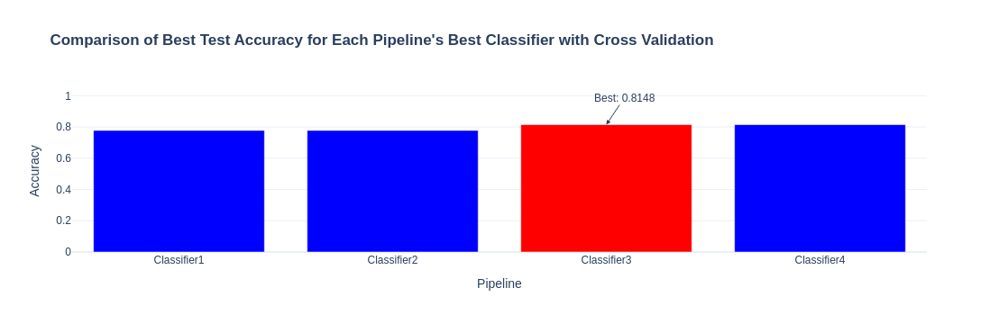

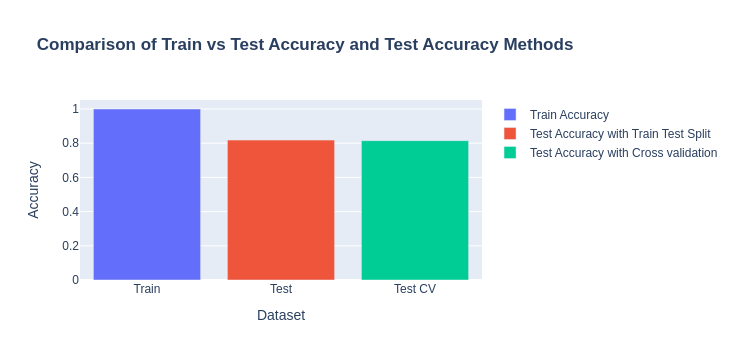

In [122]:
best_adaboost_fs_1_clf, best_score_adaboost_fs_1, best_params_adaboost_fs_1 = get_best_classifier(clfs_adaboost_fs_1)
X_train_adaboost_fs, X_test_adaboost_fs, y_train_adaboost_fs, y_test_adaboost_fs, train_score_adaboost_fs_1, test_score_adaboost_fs_1 = train_test_best_model(X,y_binary, best_adaboost_fs_1_clf, best_params_adaboost_fs_1)

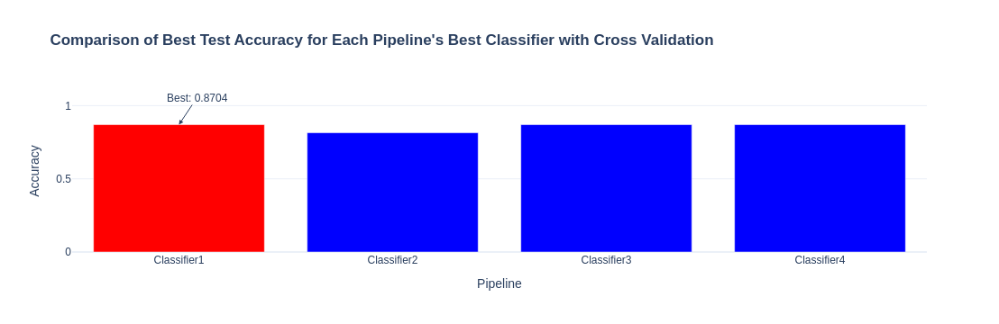

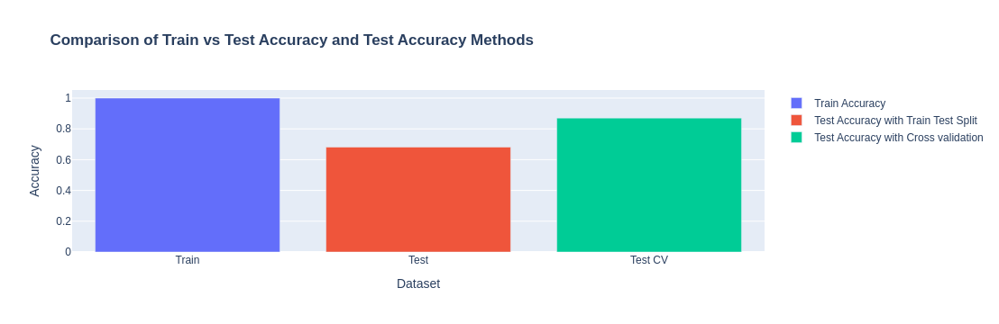

In [123]:
best_adaboost_fs_2_clf, best_score_adaboost_fs_2, best_params_adaboost_fs_2 = get_best_classifier(clfs_adaboost_fs_2)
X_train_adaboost_fs, X_test_adaboost_fs, y_train_adaboost_fs, y_test_adaboost_fs, train_score_adaboost_fs_2, test_score_adaboost_fs_2 = train_test_best_model(X,y_binary, best_adaboost_fs_2_clf, best_params_adaboost_fs_2)

<div class="alert alert-block alert-info">
We observe that with a maximum depth of 1, we achieve very good scores. However, our model overfits, as indicated by a training score of 1. Additionally, the scores are similar to those obtained from cross-validation.<br><br>

We repeated the process with a maximum depth of 2. The cross-validation results varied between 0.81 and 0.87, which is very good. However, we observed overfitting when fitting our model to the training data, which is limited in quantity. This resulted in a perfect train accuracy of 1 but an unsatisfactory test accuracy of 0.68.

This outcome is expected because, while AdaBoost effectively reduces bias by combining multiple weak learners into a strong learner, it does not inherently reduce variance. In fact, when dealing with small datasets, AdaBoost can sometimes exacerbate overfitting. This is evident in our case, where despite achieving high training scores, the model fails to generalize well to new data, indicating overfitting.

Therefore, we chose the model with the best test accuracy, which is the one with a maximum depth of 1.
</div>

#### Optimal Model Using AdaBoost with 100 Decision Trees and Max Depth of 1

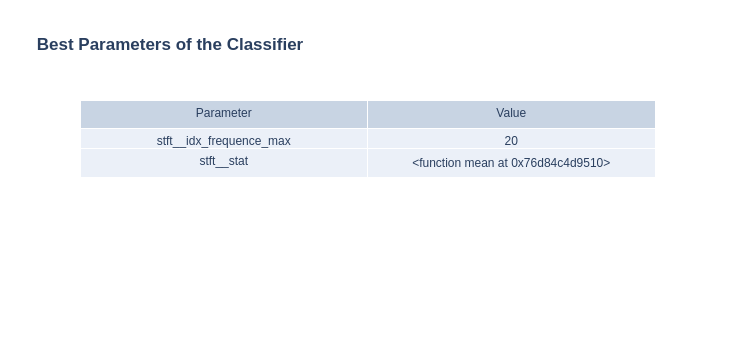

In [141]:
display_best_params_table(best_adaboost_fs_1_clf.best_params_)

#### Compare Performances : Adaboost vs Bagging (from scratch)

Now, we will compare the performance of AdaBoost and Bagging.

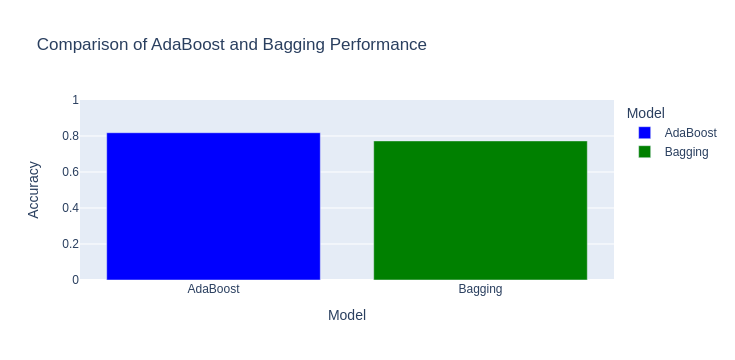

In [126]:
results = pd.DataFrame({
    'Model': ['AdaBoost', 'Bagging'],
    'Accuracy': [test_score_adaboost_fs_1, test_score_bagging_fs_1]
})

fig = px.bar(results, x='Model', y='Accuracy', color='Model',
             title='<b>Comparison of AdaBoost and Bagging Performance</b>',
             labels={'Accuracy': 'Accuracy', 'Model': 'Model'},
             color_discrete_map={'AdaBoost': 'blue', 'Bagging': 'green'})
fig.update_yaxes(range=[0, 1])
fig.show()

<div class="alert alert-block alert-info">
We observe better results with AdaBoost. The difference is not huge. AdaBoost is designed to reduce bias rather than variance, while Boosting focuses on reducing variance rather than bias. Given that we have a small dataset, which results in high variance, Bagging is the more suitable choice. In both methods, we use weak learners with max_depth=1, known as stumps.
</div>

## Boosting Methods with Decision Trees (max_depth = 2) in scikit-learn

Now, we'll set the maximum depth of our decision trees to 2 and employ various Boosting methods like AdaBoost, Gradient Boosting, and Extreme Gradient Boosting using scikit-learn.
We will work on the initial classification problem (3 classes).

### AdaBoost 

In [51]:
params_adaboost = [{
    "pca__n_components": [15,20],
    "adaboost__n_estimators": [5, 100],
    "adaboost__learning_rate": [0.1,1]
},{
    "pca__n_components": [15,20],
    "adaboost__n_estimators": [5, 100],
    "adaboost__learning_rate": [0.1,1]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80],
    "adaboost__n_estimators": [5, 100],
    "adaboost__learning_rate": [0.1,1]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80],
    "adaboost__n_estimators": [5, 100],
    "adaboost__learning_rate": [0.1,1]
}]

In [52]:
new_adaboost =AdaBoostClassifier(DecisionTreeClassifier(max_depth = 2), random_state=42)
clfs_adaboost = set_pipelines(X, y, new_adaboost, "adaboost",params_adaboost)

In [53]:
%store clfs_adaboost

Stored 'clfs_adaboost' (tuple)


In [127]:
%store -r clfs_adaboost

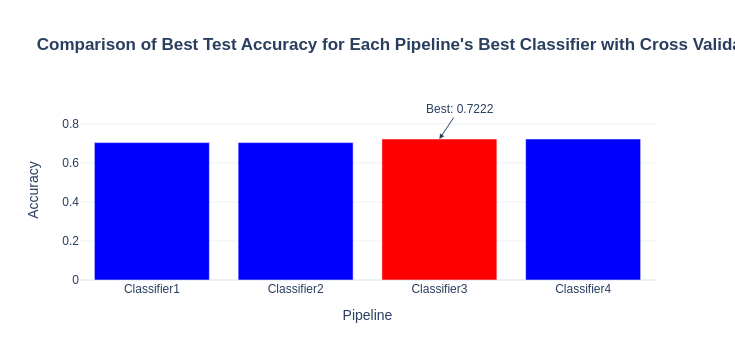

In [128]:
best_adaboost_clf, best_score_adaboost, best_params_adaboost = get_best_classifier(clfs_adaboost)
# choisir meilleur affichage pour le mean test score en fonction de la pipeline et des paramètres

#### Optimal Model Using AdaBoost (max_depth = 2)

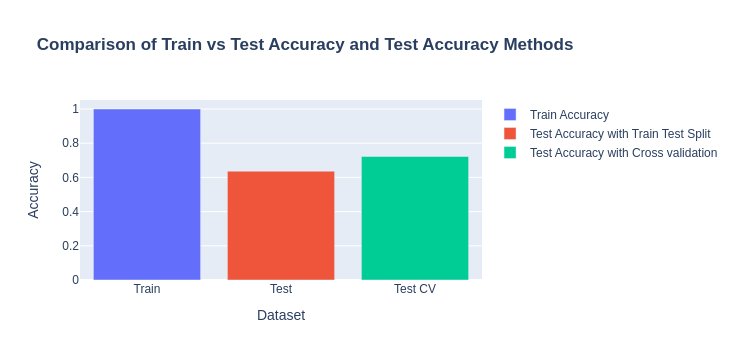

In [129]:
X_train_adaboost, X_test_adaboost, y_train_adaboost, y_test_adaboost, train_score_adaboost, test_score_adaboost= train_test_best_model(X,y, best_adaboost_clf, best_params_adaboost)

<div class="alert alert-block alert-info">
We can see that the model is overfitting. This makes sense because AdaBoost reduces bias and not variance and therefore the models tends to overfit.
</div>

### Gradient Boosting

In [130]:
params_gradient_boosting= [{
    "pca__n_components": [15,20],
    "gradientboost__n_estimators": [5, 100],
    "gradientboost__learning_rate": [0.1,1]
},{
    "pca__n_components": [15,20],
    "gradientboost__n_estimators": [5, 100],
    "gradientboost__learning_rate": [0.1,1]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80],
    "gradientboost__n_estimators": [5, 100],
    "gradientboost__learning_rate": [0.1,1]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80],
    "gradientboost__n_estimators": [5, 100],
    "gradientboost__learning_rate": [0.1,1]
}]

In [ ]:
gradientboost = GradientBoostingClassifier(max_depth=2, random_state=42)
clfs_gradientboost = set_pipelines(X, y, gradientboost, "gradientboost",params_gradient_boosting)

In [58]:
%store clfs_gradientboost

Stored 'clfs_gradientboost' (tuple)


In [132]:
%store -r clfs_gradientboost

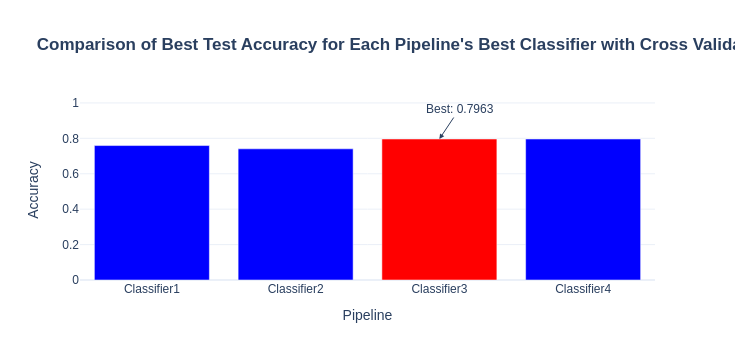

In [133]:
best_gradientboost_clf, best_score_gradientboost, best_params_gradientboost = get_best_classifier(clfs_gradientboost)
# choisir meilleur affichage pour le mean test score en fonction de la pipeline et des paramètres

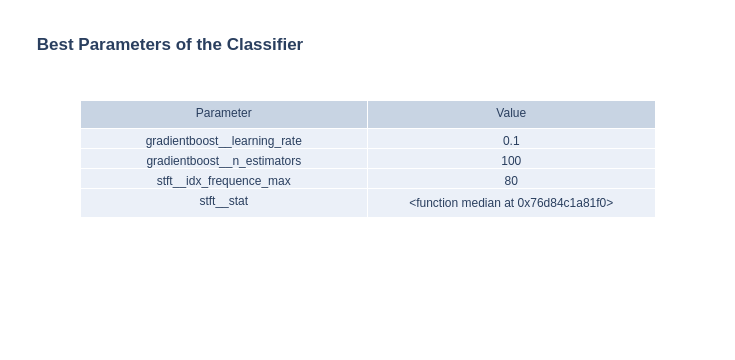

In [134]:
display_best_params_table(best_gradientboost_clf.best_params_)

#### Optimal Model Using Gradient Boosting Model (max_depth = 2)

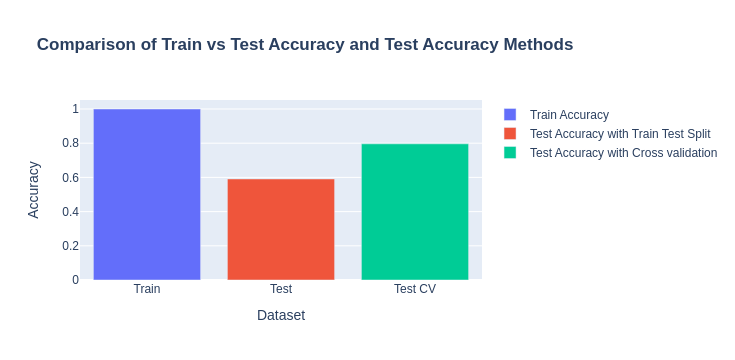

In [135]:
X_train_gradientboost, X_test_gradientboost, y_train_gradientboost, y_test_gradientboost, train_score_gradientboost, test_score_gradientboost= train_test_best_model(X,y, best_gradientboost_clf, best_params_gradientboost)

<div class="alert alert-block alert-info">
We observe that the test score for Gradient Boosting is a little worse than Adaboost (0.59<0.63). This isn't common but can be due to the fact that Gradient Boosting is more sensitive to noise in the data compared to AdaBoost.
</div>

### Extreme Gradient Boosting

In [63]:
params_XGBoost = [{
    "pca__n_components": [15,20],
    "xgboost__n_estimators": [5, 100],
    "xgboost__learning_rate": [0.1,1]
},{
    "pca__n_components": [15,20],
    "xgboost__n_estimators": [5, 100],
    "xgboost__learning_rate": [0.1,1]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80],
    "xgboost__n_estimators": [5, 100],
    "xgboost__learning_rate": [0.1,1]
},{
    "stft__stat": [np.mean, np.median, np.std, np.max, np.min],
    "stft__idx_frequence_max": [20,80],
    "xgboost__n_estimators": [5, 100],
    "xgboost__learning_rate": [0.1,1]
}]

In [73]:
xgboost = xgb.XGBClassifier(max_depth = 2, random_state=42)
clfs_XGBoost = set_pipelines(X, y, xgboost, "xgboost",params_XGBoost)

In [74]:
%store clfs_XGBoost

Stored 'clfs_XGBoost' (tuple)


In [136]:
%store -r clfs_XGBoost

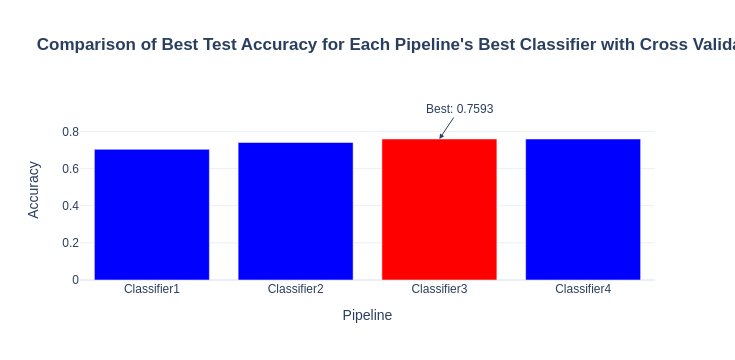

In [137]:
best_XGBoost_clf, best_score_XGBoost, best_params_XGBoost = get_best_classifier(clfs_XGBoost)
# choisir meilleur affichage pour le mean test score en fonction de la pipeline et des paramètres

#### Optimal Model Using XGBoost (max_depth = 2)

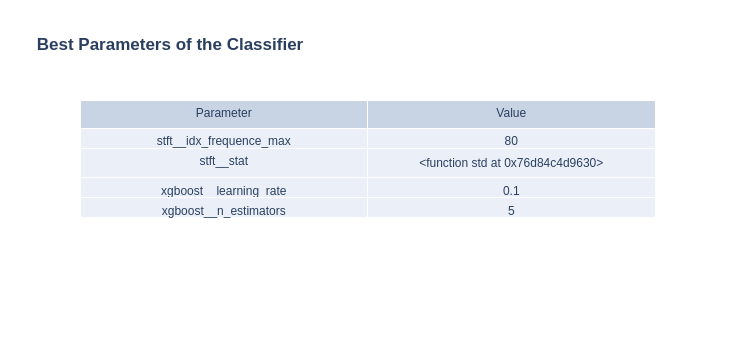

In [138]:
display_best_params_table(best_XGBoost_clf.best_params_)

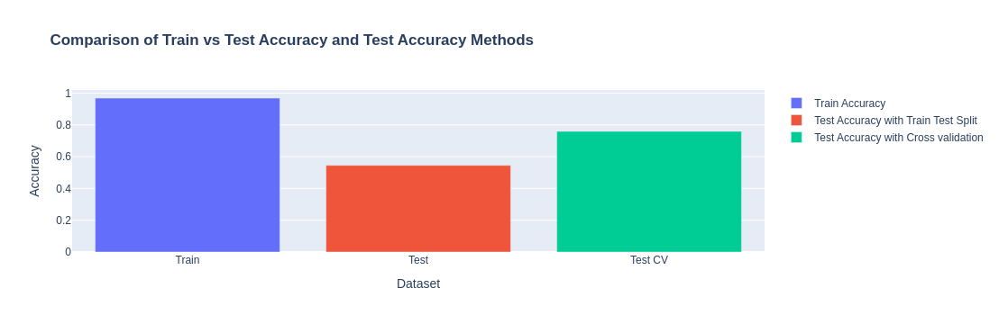

In [139]:
X_train_xgboost, X_test_xgboost, y_train_xgboost, y_test_xgboost, train_score_xgboost, test_score_xgboost= train_test_best_model(X,y, best_XGBoost_clf, best_params_XGBoost)

<div class="alert alert-block alert-info">
XGBoost test score is 0.54, which is lower than AdaBoost and Gradient Boosting. This can be due to the fact that XGBoost performs better with large datasets, which is not our case here.  
</div>

#### Understanding Feature Importance and the Role of the Root Node in Decision Trees

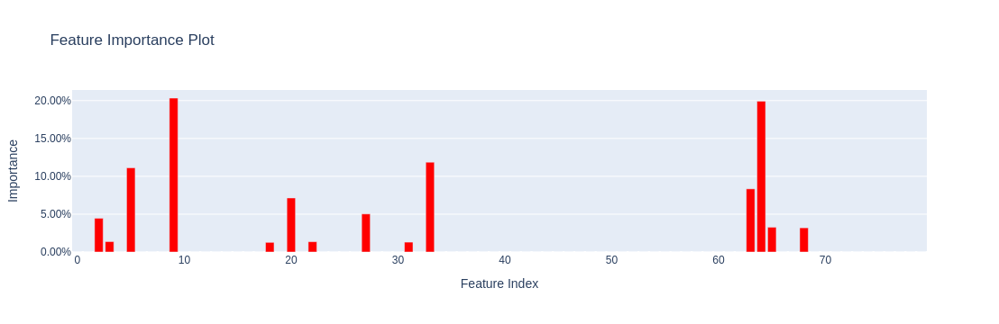

In [105]:
xgboost_model = best_XGBoost_clf.best_estimator_.named_steps["xgboost"]

importance = xgboost_model.feature_importances_

fig = go.Figure(go.Bar(
    x=list(range(len(importance))),
    y=importance,
    marker_color='red'
))

fig.update_layout(
    title="<b>Feature Importance Plot</b>",
    xaxis_title="Feature Index",
    yaxis_title="Importance",
    yaxis=dict(title='Importance', tickformat=".2%"),
    xaxis=dict(title='Feature Index'),
)

# Show the plot
fig.show()

<div class="alert alert-block alert-info">
The feature importance plot provides insight into how each feature contributes to reducing Gini impurity across all splits in a decision tree. In essence, it showcases which features have the most significant impact on the decision-making process. <br><br>

The figure above shows that the 9th, and 64th features are the most important ones. This suggests that they are strong candidates for being chosen as the root nodes of a decision tree. In fact, the root node of a decision tree is the first and most important split, as it represents the feature that provides the highest reduction in Gini impurity for the entire dataset. 

We can see in the figure below an example of a decision tree with a depth of 2. We  observe that the root node, responsible for the initial split, corresponds to feature 9, which makes sense.
</div>

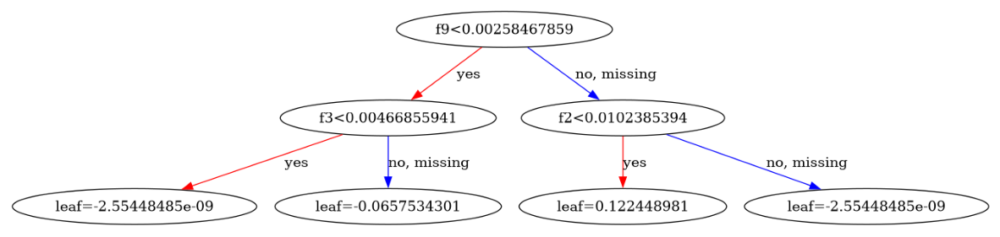

In [101]:
fig, ax = plt.subplots(figsize=(15, 15))
xgb.plot_tree(best_XGBoost_clf.best_estimator_.named_steps["xgboost"], ax=ax, num_trees=0, rankdir='TB')
plt.show()

# IV) Neural Network with pytorch

## Data preparation

We prepare 2 sets of data. One where we apply stft and another where we apply stft & scaling.

In [50]:
scaler_nn = StandardScaler()
scaler_nn.fit(X)
X_nn_scaled = scaler_nn.transform(X)
X_preprocessed_nn = STFT(idx_frequence_max = 90, stat = np.mean).transform(X_nn_scaled)

X_train_sc, X_test_sc, y_train_sc, y_test_sc = train_test_split(X_preprocessed_nn,y,test_size=0.5, random_state=42)
X_train_sc = torch.tensor(X_train_sc).reshape((X_train_sc.shape[0],1,-1)).float()
X_test_sc = torch.tensor(X_test_sc).reshape((X_test_sc.shape[0],1,-1)).float()
y_train_sc = torch.nn.functional.one_hot(torch.tensor(y_train_sc), num_classes=- 1).reshape((X_train_sc.shape[0],1,-1)).float()
y_test_sc = torch.nn.functional.one_hot(torch.tensor(y_test_sc), num_classes=- 1).reshape((X_test_sc.shape[0],1,-1)).float()

In [51]:
X_preprocessed_nn = STFT(idx_frequence_max = 90, stat = np.mean).transform(X)

X_train_stft, X_test_stft, y_train_stft, y_test_stft = train_test_split(X_preprocessed_nn,y,test_size=0.5, random_state=42)
X_train_stft = torch.tensor(X_train_stft).reshape((X_train_stft.shape[0],1,-1)).float()
X_test_stft = torch.tensor(X_test_stft).reshape((X_test_stft.shape[0],1,-1)).float()
y_train_stft = torch.nn.functional.one_hot(torch.tensor(y_train_stft), num_classes=- 1).reshape((X_train_stft.shape[0],1,-1)).float()
y_test_stft = torch.nn.functional.one_hot(torch.tensor(y_test_stft), num_classes=- 1).reshape((X_test_stft.shape[0],1,-1)).float()

## FNN

In this part, we create simple neural networks. The first has a single layer and the second has several.

In [52]:
class NN1_Classification(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.network = torch.nn.Sequential(
            torch.nn.Linear(90, 3),
            torch.nn.Softmax(dim = 1)
        )
    
    def forward(self, xb):
        return self.network(xb)

In [53]:
class NN_Multi_Classification(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.network = torch.nn.Sequential(
            torch.nn.Linear(90, 200),
            torch.nn.ReLU(),
            torch.nn.Linear(200, 150),
            torch.nn.ReLU(),
            torch.nn.Linear(150, 3),  
            torch.nn.Softmax(dim = 1)
        )
    
    def forward(self, xb):
        return self.network(xb)

## Results

We define our loss function by the cross entropy because it is the loss used for classification problems.

In [54]:
loss = torch.nn.CrossEntropyLoss()

### One Layer

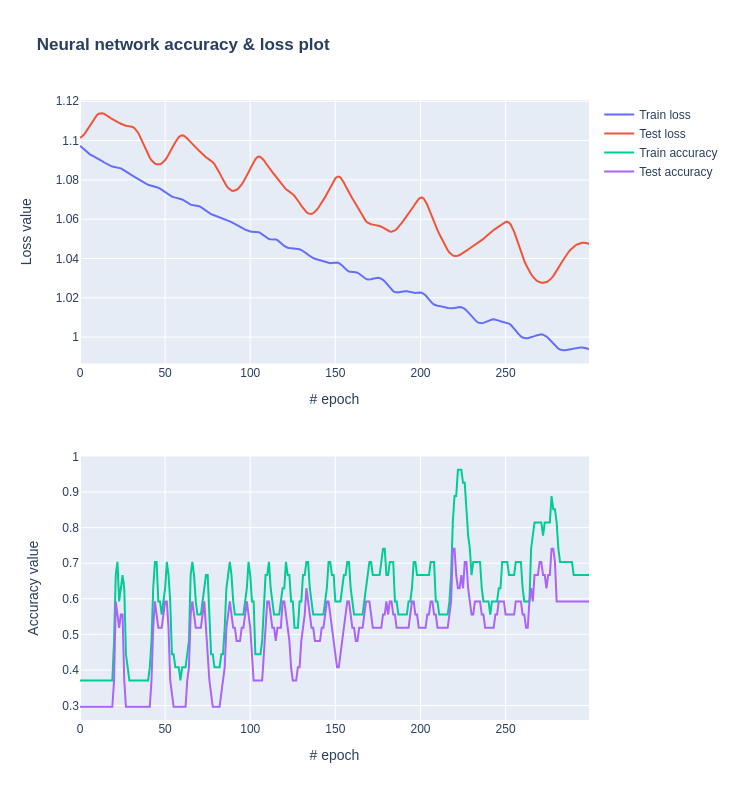

In [83]:
nn_plot(compute_nn(X_train_stft, X_test_stft, y_train_stft, y_test_stft, NN1_Classification(), 0.001, 300, loss))

<div class="alert alert-block alert-info">
We observe that our loss functions are decreasing. However, the test loss is fluctuating which means that our learning rate is too high. Thus, this means that we are overfitting with our train data.</div>

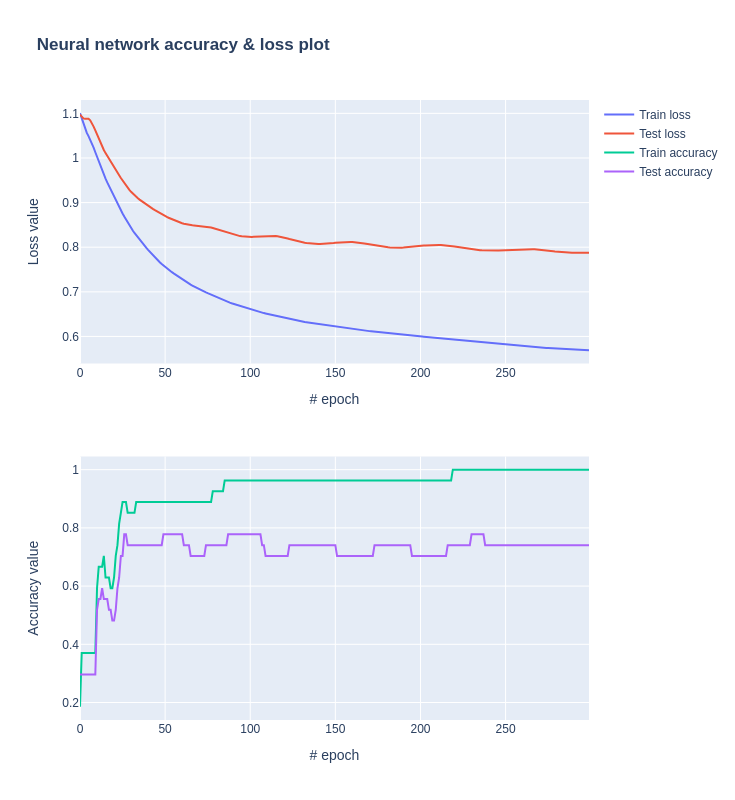

In [106]:
nn_plot(compute_nn(X_train_sc, X_test_sc, y_train_sc, y_test_sc, NN1_Classification(), 0.001, 300, loss))

<div class="alert alert-block alert-info">
When we preprocess our data, we observe that our loss functions both decrease well. However, we notice that the model is overfitting the training data. 
</div>

### Multi-Layer 

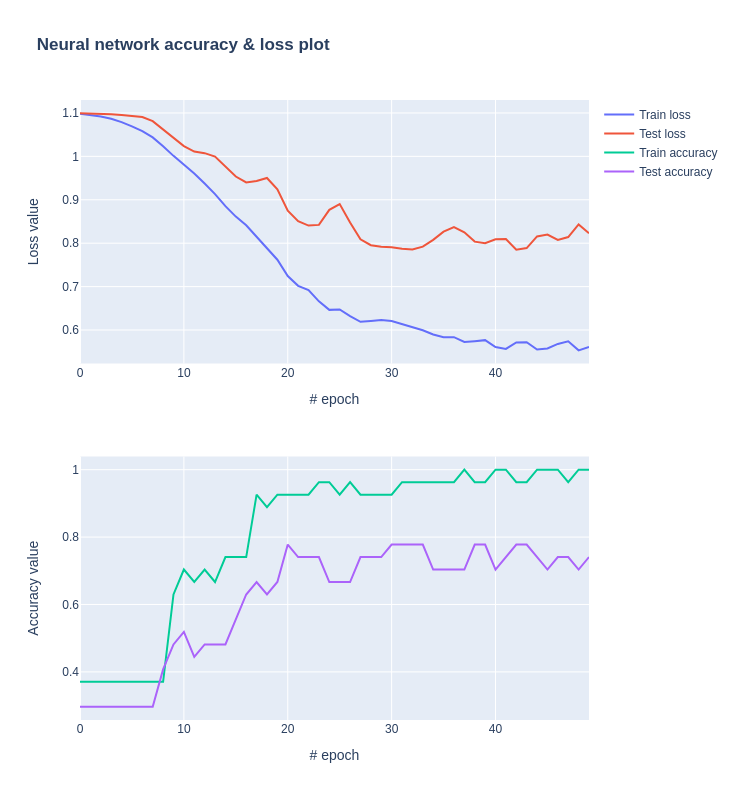

In [91]:
nn_plot(compute_nn(X_train_sc, X_test_sc, y_train_sc, y_test_sc, NN_Multi_Classification(), 0.0001, 50, loss))

<div class="alert alert-block alert-info">
With Multi-Layer Neural Network and not scaled data, the model overfits very quickly and doesn't stabilize. 
</div>

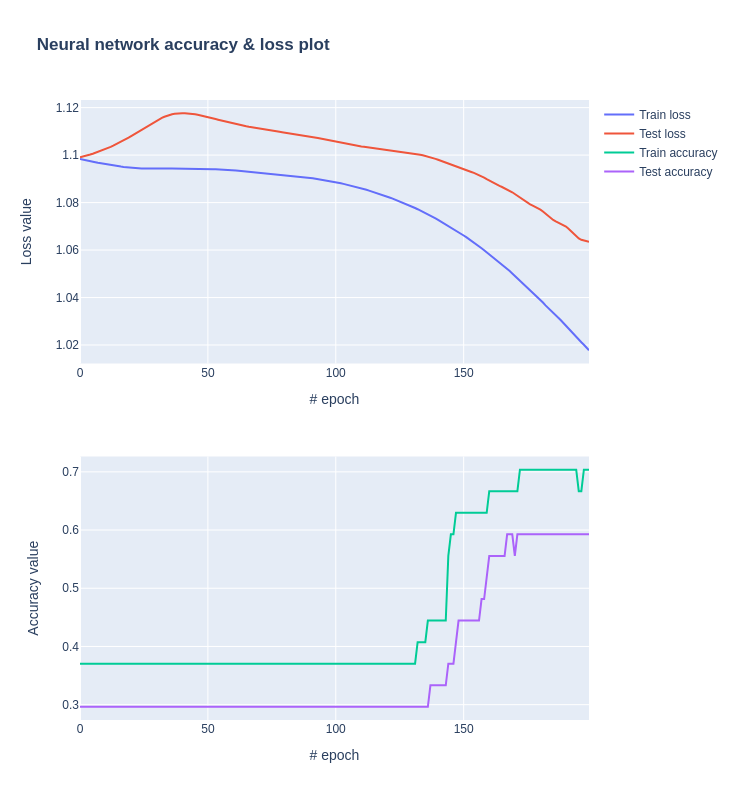

In [105]:
nn_plot(compute_nn(X_train_stft, X_test_stft, y_train_stft, y_test_stft, NN_Multi_Classification(), 0.00002, 200, loss))

<div class="alert alert-block alert-info">
Here, we observe that our loss functions decrease well. On the other hand, the model starts converging after 130 epochs which means that our learning rate is too small at first. One solution is to divide the learning rate during the train, we could use the function LearningRateScheduler. <br> <br>

Thus, we remark that working with a multi-layer model is not really interesting, since we could have a lot a instability. It is better to work with one layer, we already have great results.
    
</div>

### L2 Regularization

Now, we will try to apply L2 regularization on the model that overfits, which means the Neural Network model with one layer, and with X preprocessed this way : scaling and STFT.

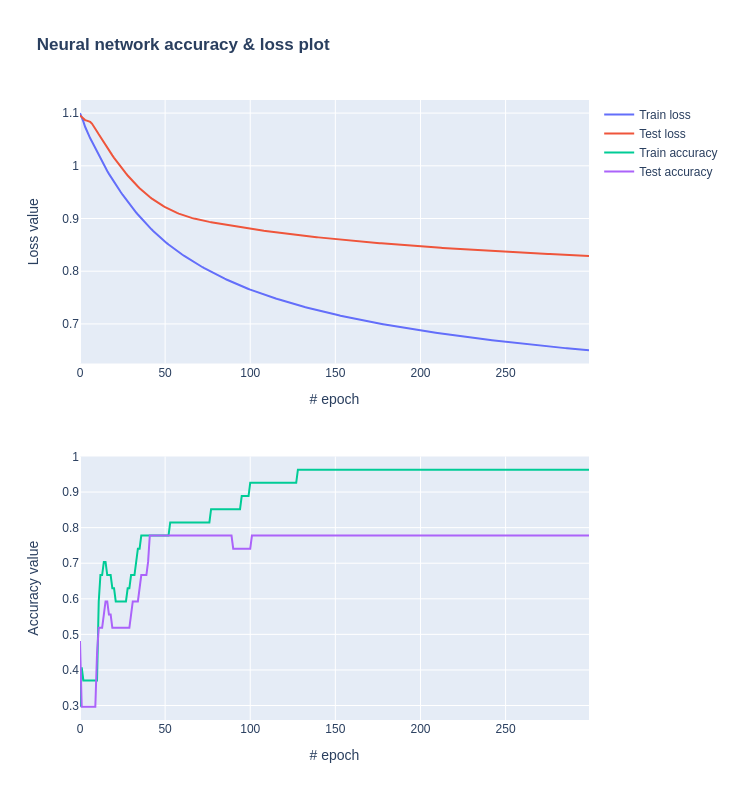

In [109]:
nn_plot(compute_nn(X_train_sc, X_test_sc, y_train_sc, y_test_sc, NN1_Classification(), 0.001, 300, loss, wc=1.5))

<div class="alert alert-block alert-info">
Thanks to L2 regularization, we observe that our model is not overfitting anymore. In this case, we could have done less epochs instead of overtraining our model. 
</div>

## CNN

In [114]:
class CNN_Classification(torch.nn.Module):
    def __init__(self):
        super(CNN_Classification, self).__init__()
        self.conv1 = torch.nn.Conv1d(in_channels=1, out_channels=1, kernel_size=2)
        self.pool = torch.nn.MaxPool1d(kernel_size=2, stride=2)
 
        self.fc_input_size = 1 * (18522 // 2)-1
        self.fc1 = torch.nn.Linear(self.fc_input_size, 3)  

    def forward(self, x): 
        x = self.pool(torch.nn.functional.relu(self.conv1(x)))
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

In [115]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.5, random_state=42)
X_train = torch.tensor(X_train).reshape((X_train.shape[0],1,-1)).float()
X_test = torch.tensor(X_test).reshape((X_test.shape[0],1,-1)).float()
y_train = torch.nn.functional.one_hot(torch.tensor(y_train), num_classes=- 1).reshape((X_train.shape[0],1,-1)).float()
y_test = torch.nn.functional.one_hot(torch.tensor(y_test), num_classes=- 1).reshape((X_test.shape[0],1,-1)).float()

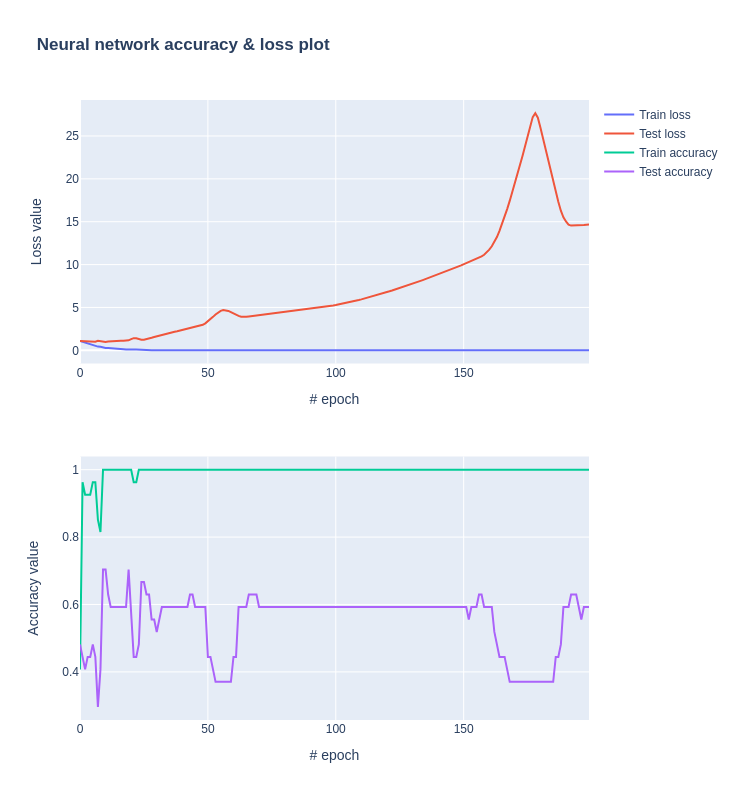

In [117]:
nn_plot(compute_nn(X_train, X_test, y_train, y_test, CNN_Classification(), 0.0001, 200, loss))

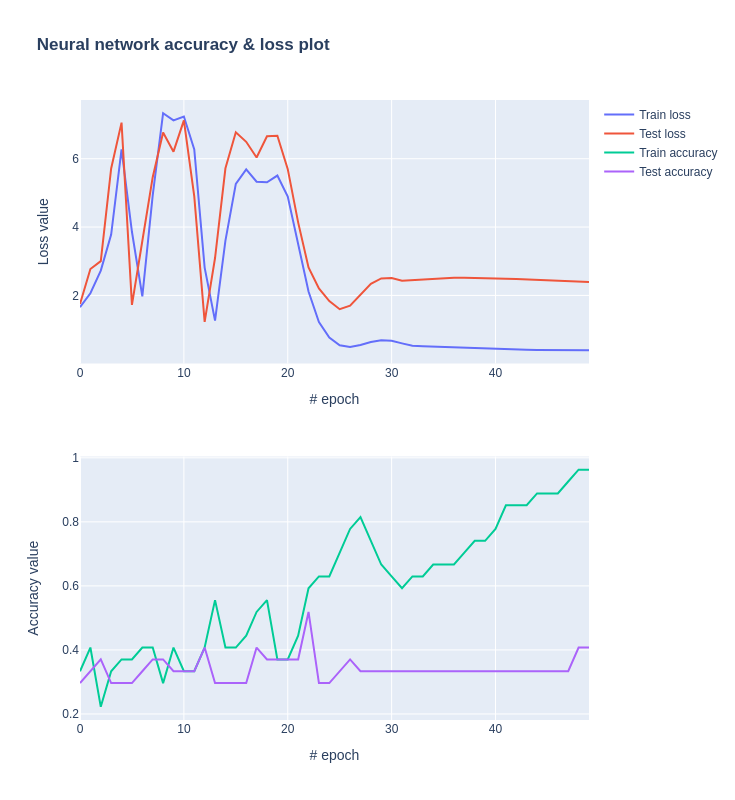

In [122]:
nn_plot(compute_nn(X_train, X_test, y_train, y_test, CNN_Classification(), 0.0001, 50, loss))

<div class="alert alert-block alert-info">
When working with Convolutional Neural Networks (CNNs), we obtain bad scores. Our loss functions don't converge and our test accuracy is really low. <br> <br>    
    
In fact, CNNs typically require a large amount of data to learn meaningful patterns effectively. However, our dataset is very limited resulting in a model that may struggle to generalize well to unseen data, leading to poor performance.
</div>

# V) Clustering

We apply Gaussian mixtures to see if we find the genres and commands clusters. We apply this to two sets of transformed data. And we scale each time.

In [156]:
fft_class = FFT()
stft_class = STFT(idx_frequence_max = 90, stat = np.mean)
scaler = StandardScaler()
pca_test = PCA(n_components = 15)

In [157]:
X_fft = fft_class.transform(X)
X_stft = stft_class.transform(X)
X_fft_scale = scaler.fit_transform(X_fft)
X_stft_scale = scaler.fit_transform(X_stft)
X_fft_pca = pca_test.fit_transform(X_fft_scale)

In [186]:
grid_search_fft, grid_search_stft = gaussian_mixture_grid_search(X)

In [187]:
df_fft, df_stft = df_grid_search(grid_search_fft, grid_search_stft)

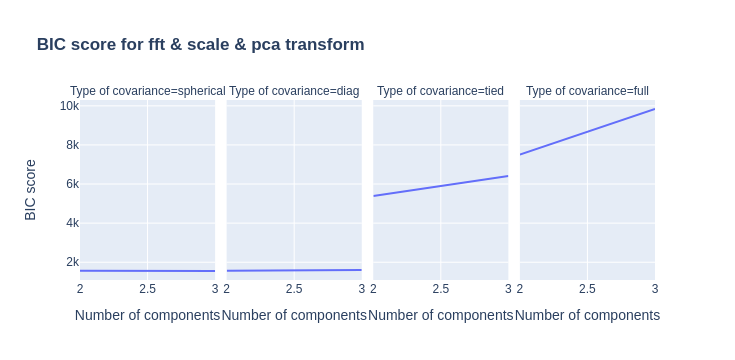

In [188]:
plot_BIC_score(df_fft, 'fft')

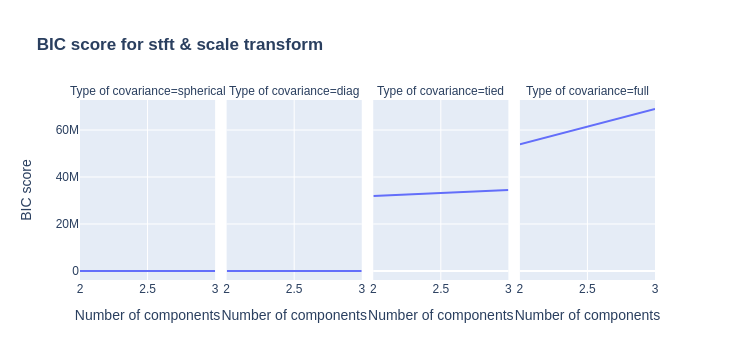

In [189]:
plot_BIC_score(df_stft, 'stft')

<div class="alert alert-block alert-info">
We have more or less the same values ​​of the BIC criterion for 2 or 3 classes. It's random so we find different values ​​each time. But the spherical model is the most suitable for our data. </div>

<div class="alert alert-block alert-info">
We see that we have overall better results with the data transformed by fft with the dataframe below. </div>

In [190]:
(pd.concat([df_fft, df_stft], axis = 0).sort_values(by = ['BIC score']).reset_index(drop=True))

,Transform,Number of components,Type of covariance,Params,BIC score
0,fft & scale & pca,3,spherical,spherical 3,1.552081e+03
1,fft & scale & pca,2,spherical,spherical 2,1.562163e+03
2,fft & scale & pca,2,diag,diag 2,1.569651e+03
3,fft & scale & pca,3,diag,diag 3,1.604891e+03
4,stft & scale,2,spherical,spherical 2,2.563955e+03
5,stft & scale,3,spherical,spherical 3,2.660503e+03
6,stft & scale,2,diag,diag 2,3.386141e+03
7,stft & scale,3,diag,diag 3,3.720334e+03
8,fft & scale & pca,2,tied,tied 2,5.391222e+03
9,fft & scale & pca,3,tied,tied 3,6.416738e+03


<div class="alert alert-block alert-info">
We notice, with the confusion matrices below, that in general we manage to classify one category but then the others are not very correct.</div>

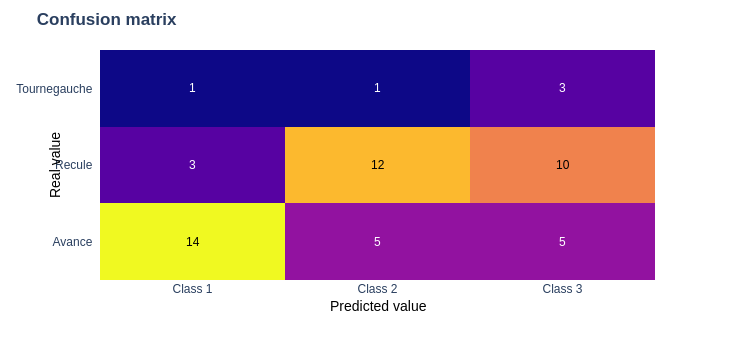

In [203]:
confusion_matrix_clust(grid_search_fft, X_fft_pca)

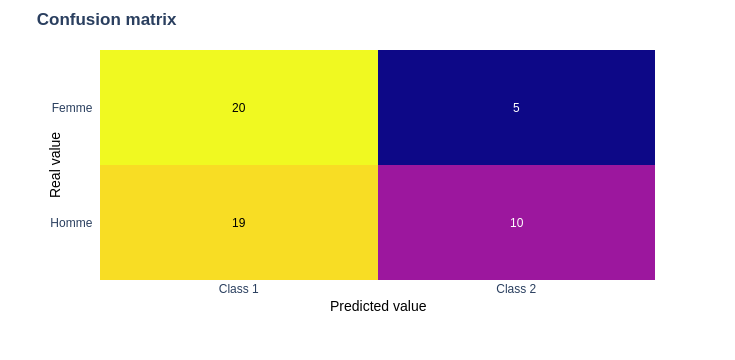

In [198]:
confusion_matrix_clust(grid_search_stft, X_stft_scale)

# Conclusion

This project helped us to understand and visualize better each classification method. In fact, we understood how each algorith works and how to use it well depending on the context. We also improved our python coding skills. 